Initially I defined the symbols $r_1$, $r_2$, $\Psi$ and Laplacian and Hamiltonian Operator. Later I defined other spherical coordinates $\theta_1$, $\theta_2$, $\Phi_1$ and $\Phi_2$. These other coordinates are defined to find $\ |\vec{r_1} - \vec{r_2}|$ . So to find $\ |\vec{r_1} - \vec{r_2}|$, I have to find the angle between $\vec{r_1}$ and $\vec{r_2}$ since $\ |\vec{r_1} - \vec{r_2}|$ = $\sqrt{r_1^2 + r_2^2 - 2 r_1 r_2 \cos(\theta)}$. Now $\cos(\theta) = \frac{\vec{r_1}.\vec{r_2}}{|\vec{r_1}||\vec{r_2}|}$. So I have defined $\vec{r_1}$ and $\vec{r_2}$ in cartesian coordinates by the relation

$$ x = r \sin(\theta) \cos(\phi)$$
$$ y = r \sin(\theta) \sin(\phi)$$
$$ z = r \cos(\theta)$$

as you will see below.

In [ ]:
import sympy as smp
r1, r2 = smp.symbols('r1 r2 ', real=True, positive=True)

# Define the absolute value with a small regularization term
absolute_diff = smp.Abs(r1 - r2)

V = smp.Function('V')(r1, r2)
Psi = smp.Function('Psi')(r1, r2)

Laplacian = (1/r1**2) * smp.diff(r1**2 * smp.diff(Psi, r1), r1) + (1/r2**2) * smp.diff(r2**2 * smp.diff(Psi, r2), r2)
Hamiltonian = -(1/2) * Laplacian + V * Psi

In [ ]:
theta = smp.symbols('theta')
theta1, phi1 = smp.symbols('theta_1 phi_1')
theta2, phi2 = smp.symbols('theta_2 phi_2')

x1 = smp.Function(r'x1')(r1, theta1, phi1)
x2 = smp.Function(r'x2')(r2, theta2, phi2)

y1 = smp.Function(r'x1')(r1, theta1, phi1)
y2 = smp.Function(r'x2')(r2, theta2, phi2)

z1 = smp.Function(r'x1')(r1, theta1)
z2 = smp.Function(r'x2')(r2, theta2)

In [ ]:
x1 = r1 * smp.sin(theta1) * smp.cos(phi1)
x2 = r2 * smp.sin(theta2) * smp.cos(phi2)

y1 = r1 * smp.sin(theta1) * smp.sin(phi1)
y2 = r2 * smp.sin(theta2) * smp.sin(phi2)

z1 = r1 * smp.cos(theta1)
z2 = r2 * smp.cos(theta2)

In [ ]:
absolute_diff = smp.sqrt(r1**2 + r2**2 - 2*r1*r2*smp.cos(theta))

Here I defined all the basis functions, first symbolically and then written the expressions for them. After that I have defined $\hat{H}\Phi_i$ for all basis functions and then I defined and found explicitly, the expression of all the $f_{ij}$ terms which is given by

$$ f_{ij} = \Phi_i^*\hat{H}\Phi_j  r_1^2 r_2^2 $$

In [ ]:
Phi_1 = smp.Function('\Phi_1')(r1, r2)
Phi_2 = smp.Function('\Phi_2')(r1, r2)
Phi_3 = smp.Function('\Phi_3')(r1, r2)
Phi_4 = smp.Function('\Phi_4')(r1, r2)
Phi_5 = smp.Function('\Phi_5')(r1, r2)
Phi_6 = smp.Function('\Phi_6')(r1, r2)
Phi_7 = smp.Function('\Phi_7')(r1, r2)

In [ ]:
Phi_1 = smp.exp(-2 * (r1 + r2))
Phi_2 = smp.exp(-2 * (r1 + r2)) * (r1 + r2)
Phi_3 = smp.exp(-2 * (r1 + r2)) * (absolute_diff)
Phi_4 = smp.exp(-2 * (r1 + r2)) * r1 * r2
Phi_5 = smp.exp(-2 * (r1 + r2)) * (r1**2 + r2**2)
Phi_6 = smp.exp(-2 * (r1 + r2)) * (absolute_diff)**2
Phi_7 = smp.exp(-2 * (r1 + r2)) * (r1 + r2) * (absolute_diff)

In [ ]:
V_eff = -2/r1 - 2/r2 + 1/(absolute_diff)

In [ ]:
H_Phi_1 = Hamiltonian.subs({Psi: Phi_1, V:V_eff}).simplify()
H_Phi_2 = Hamiltonian.subs({Psi: Phi_2, V:V_eff}).simplify()
H_Phi_3 = Hamiltonian.subs({Psi: Phi_3, V:V_eff}).simplify()
H_Phi_4 = Hamiltonian.subs({Psi: Phi_4, V:V_eff}).simplify()
H_Phi_5 = Hamiltonian.subs({Psi: Phi_5, V:V_eff}).simplify()
H_Phi_6 = Hamiltonian.subs({Psi: Phi_6, V:V_eff}).simplify()
H_Phi_7 = Hamiltonian.subs({Psi: Phi_7, V:V_eff}).simplify()

In [ ]:
f_11 = (Phi_1 * H_Phi_1) * r1**2 * r2**2
f_11 = f_11.simplify()
f_11

r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2)

In [ ]:
f_12 = (Phi_1 * H_Phi_2) * r1**2 * r2**2
f_12 = f_12.simplify()
f_12

-r1*r2*(4.0*r1**2*r2 - 1.0*r1**2*r2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1*r2**2 - 1.0*r1*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4.0*r1*r2 + 1.0*r1 + 1.0*r2)*exp(-4*r1 - 4*r2)

In [ ]:
f_13 = (Phi_1 * H_Phi_3) * r1**2 * r2**2
f_13 = f_13.simplify()
f_13

r1*r2*(-4.0*r1**5*r2 + 16.0*r1**4*r2**2*cos(theta) - 2.0*r1**4*r2*cos(theta) + 2.0*r1**4*r2 + 1.0*r1**4*cos(theta) - 16.0*r1**3*r2**3*cos(theta)**2 - 8.0*r1**3*r2**3 + 4.0*r1**3*r2**2*cos(theta)**2 - 6.0*r1**3*r2**2*cos(theta) + 2.0*r1**3*r2**2 + 1.0*r1**3*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 1.5*r1**3*r2*cos(theta)**2 - 2.5*r1**3*r2 + 16.0*r1**2*r2**4*cos(theta) + 4.0*r1**2*r2**3*cos(theta)**2 - 6.0*r1**2*r2**3*cos(theta) + 2.0*r1**2*r2**3 - 2.0*r1**2*r2**2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2)*cos(theta) + 6.0*r1**2*r2**2*cos(theta) - 4.0*r1*r2**5 - 2.0*r1*r2**4*cos(theta) + 2.0*r1*r2**4 + 1.0*r1*r2**3*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 1.5*r1*r2**3*cos(theta)**2 - 2.5*r1*r2**3 + 1.0*r2**4*cos(theta))*exp(-4*r1 - 4*r2)/((1.0*r1**2 - 2.0*r1*r2*cos(theta) + 1.0*r2**2)*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))

In [ ]:
f_14 = (Phi_1 * H_Phi_4) * r1**2 * r2**2
f_14 = f_14.simplify()
f_14

-r1*r2*(4.0*r1**2*r2**2 - 1.0*r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 2.0*r1**2*r2 + 1.0*r1**2 - 2.0*r1*r2**2 + 1.0*r2**2)*exp(-4*r1 - 4*r2)

In [ ]:
f_15 = (Phi_1 * H_Phi_5) * r1**2 * r2**2
f_15 = f_15.simplify()
f_15

r1**2*r2**2*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2)

In [ ]:
f_16 = (Phi_1 * H_Phi_6) * r1**2 * r2**2
f_16 = f_16.simplify()
f_16

1.0*r1*r2*(-4.0*r1**3*r2 + 8.0*r1**2*r2**2*cos(theta) - 4.0*r1**2*r2*cos(theta) + 4.0*r1**2*r2 + 2.0*r1**2*cos(theta) - 4.0*r1*r2**3 - 4.0*r1*r2**2*cos(theta) + 4.0*r1*r2**2 + 1.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*r1*r2 + 2.0*r2**2*cos(theta))*exp(-4*r1 - 4*r2)

In [ ]:
f_17 = (Phi_1 * H_Phi_7) * r1**2 * r2**2
f_17 = f_17.simplify()
f_17

r1*r2*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2)

In [ ]:
f_22 = (Phi_2 * H_Phi_2) * r1**2 * r2**2
f_22 = f_22.simplify()
f_22

-r1*r2*(r1 + r2)*(4.0*r1**2*r2 - 1.0*r1**2*r2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1*r2**2 - 1.0*r1*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4.0*r1*r2 + 1.0*r1 + 1.0*r2)*exp(-4*r1 - 4*r2)

In [ ]:
f_23 = (Phi_2 * H_Phi_3) * r1**2 * r2**2
f_23 = f_23.simplify()
f_23

-r1*r2*(r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 - r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-0.5*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2 - (r1*cos(theta) - r2)**2 + 4*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + 1.0*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 2.0*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 - r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-0.5*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2 - (r1 - r2*cos(theta))**2 - 4*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 2.0*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2)

In [ ]:
f_24 = (Phi_2 * H_Phi_4) * r1**2 * r2**2
f_24 = f_24.simplify()
f_24

-r1*r2*(r1 + r2)*(4.0*r1**2*r2**2 - 1.0*r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 2.0*r1**2*r2 + 1.0*r1**2 - 2.0*r1*r2**2 + 1.0*r2**2)*exp(-4*r1 - 4*r2)

In [ ]:
f_25 = (Phi_2 * H_Phi_5) * r1**2 * r2**2
f_25 = f_25.simplify()
f_25

r1**2*r2**2*(r1 + r2)*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2)

In [ ]:
f_26 = (Phi_2 * H_Phi_6) * r1**2 * r2**2
f_26 = f_26.simplify()
f_26

r1*r2*(r1 + r2)*(-4.0*r1**3*r2 + 8.0*r1**2*r2**2*cos(theta) - 4.0*r1**2*r2*cos(theta) + 4.0*r1**2*r2 + 2.0*r1**2*cos(theta) - 4.0*r1*r2**3 - 4.0*r1*r2**2*cos(theta) + 4.0*r1*r2**2 + 1.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*r1*r2 + 2.0*r2**2*cos(theta))*exp(-4*r1 - 4*r2)

In [ ]:
f_27 = (Phi_2 * H_Phi_7) * r1**2 * r2**2
f_27 = f_27.simplify()
f_27

r1*r2*(r1 + r2)*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2)

In [ ]:
f_33 = (Phi_3 * H_Phi_3) * r1**2 * r2**2
f_33 = f_33.simplify()
f_33

r1*r2*(-4.0*r1**5*r2 + 16.0*r1**4*r2**2*cos(theta) - 2.0*r1**4*r2*cos(theta) + 2.0*r1**4*r2 + 1.0*r1**4*cos(theta) - 16.0*r1**3*r2**3*cos(theta)**2 - 8.0*r1**3*r2**3 + 4.0*r1**3*r2**2*cos(theta)**2 - 6.0*r1**3*r2**2*cos(theta) + 2.0*r1**3*r2**2 + 1.0*r1**3*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 1.5*r1**3*r2*cos(theta)**2 - 2.5*r1**3*r2 + 16.0*r1**2*r2**4*cos(theta) + 4.0*r1**2*r2**3*cos(theta)**2 - 6.0*r1**2*r2**3*cos(theta) + 2.0*r1**2*r2**3 - 2.0*r1**2*r2**2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2)*cos(theta) + 6.0*r1**2*r2**2*cos(theta) - 4.0*r1*r2**5 - 2.0*r1*r2**4*cos(theta) + 2.0*r1*r2**4 + 1.0*r1*r2**3*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 1.5*r1*r2**3*cos(theta)**2 - 2.5*r1*r2**3 + 1.0*r2**4*cos(theta))*exp(-4*r1 - 4*r2)/(1.0*r1**2 - 2.0*r1*r2*cos(theta) + 1.0*r2**2)

In [ ]:
f_34 = (Phi_3 * H_Phi_4) * r1**2 * r2**2
f_34 = f_34.simplify()
f_34

r1*r2*(1.0*r1**2*r2**2 + r1**2*(2.0*r2 - 1.0)*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 2.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(r1*(r2 - 1) + r1 + r2*(r1 - 1) + r2) + r2**2*(2.0*r1 - 1.0)*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2)

In [ ]:
f_35 = (Phi_3 * H_Phi_5) * r1**2 * r2**2
f_35 = f_35.simplify()
f_35

r1**2*r2**2*(-4.0*r1**2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 1.0*r1**2 + 4.0*r1*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4.0*r2**2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 1.0*r2**2 + 4.0*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2)

In [ ]:
f_36 = (Phi_3 * H_Phi_6) * r1**2 * r2**2
f_36 = f_36.simplify()
f_36

r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-4.0*r1**3*r2 + 8.0*r1**2*r2**2*cos(theta) - 4.0*r1**2*r2*cos(theta) + 4.0*r1**2*r2 + 2.0*r1**2*cos(theta) - 4.0*r1*r2**3 - 4.0*r1*r2**2*cos(theta) + 4.0*r1*r2**2 + 1.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*r1*r2 + 2.0*r2**2*cos(theta))*exp(-4*r1 - 4*r2)

In [ ]:
f_37 = (Phi_3 * H_Phi_7) * r1**2 * r2**2
f_37 = f_37.simplify()
f_37

r1*r2*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2

In [ ]:
f_44 = (Phi_4 * H_Phi_4) * r1**2 * r2**2
f_44 = f_44.simplify()
f_44

r1**2*r2**2*(-4.0*r1**2*r2**2 + 1.0*r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 2.0*r1**2*r2 - 1.0*r1**2 + 2.0*r1*r2**2 - 1.0*r2**2)*exp(-4*r1 - 4*r2)

In [ ]:
f_45 = (Phi_4 * H_Phi_5) * r1**2 * r2**2
f_45 = f_45.simplify()
f_45

r1**3*r2**3*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2)

In [ ]:
f_46 = (Phi_4 * H_Phi_6) * r1**2 * r2**2
f_46 = f_46.simplify()
f_46

r1**2*r2**2*(-4.0*r1**3*r2 + 8.0*r1**2*r2**2*cos(theta) - 4.0*r1**2*r2*cos(theta) + 4.0*r1**2*r2 + 2.0*r1**2*cos(theta) - 4.0*r1*r2**3 - 4.0*r1*r2**2*cos(theta) + 4.0*r1*r2**2 + 1.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*r1*r2 + 2.0*r2**2*cos(theta))*exp(-4*r1 - 4*r2)

In [ ]:
f_47 = (Phi_4 * H_Phi_7) * r1**2 * r2**2
f_47 = f_47.simplify()
f_47

r1**2*r2**2*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 + 4*(-r1 - r2 + 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 + 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(r1*cos(theta) - r2 - 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 4*(-r1 - r2 + 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2)) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2)

In [ ]:
f_55 = (Phi_5 * H_Phi_5) * r1**2 * r2**2
f_55 = f_55.simplify()
f_55

r1**2*r2**2*(r1**2 + r2**2)*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2)

In [ ]:
f_56 = (Phi_5 * H_Phi_6) * r1**2 * r2**2
f_56 = f_56.simplify()
f_56

r1*r2*(r1**2 + r2**2)*(-4.0*r1**3*r2 + 8.0*r1**2*r2**2*cos(theta) - 4.0*r1**2*r2*cos(theta) + 4.0*r1**2*r2 + 2.0*r1**2*cos(theta) - 4.0*r1*r2**3 - 4.0*r1*r2**2*cos(theta) + 4.0*r1*r2**2 + 1.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*r1*r2 + 2.0*r2**2*cos(theta))*exp(-4*r1 - 4*r2)

In [ ]:
f_57 = (Phi_5 * H_Phi_7) * r1**2 * r2**2
f_57 = f_57.simplify()
f_57

r1*r2*(r1**2 + r2**2)*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/

In [ ]:
f_66 = (Phi_6 * H_Phi_6) * r1**2 * r2**2
f_66 = f_66.simplify()
f_66

r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-4.0*r1**3*r2 + 8.0*r1**2*r2**2*cos(theta) - 4.0*r1**2*r2*cos(theta) + 4.0*r1**2*r2 + 2.0*r1**2*cos(theta) - 4.0*r1*r2**3 - 4.0*r1*r2**2*cos(theta) + 4.0*r1*r2**2 + 1.0*r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 6.0*r1*r2 + 2.0*r2**2*cos(theta))*exp(-4*r1 - 4*r2)

In [ ]:
f_67 = (Phi_6 * H_Phi_7) * r1**2 * r2**2
f_67 = f_67.simplify()
f_67

r1*r2*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(3/2)

In [ ]:
f_77 = (Phi_7 * H_Phi_7) * r1**2 * r2**2
f_77 = f_77.simplify()
f_77

r1*r2*(r1 + r2)*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) + r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r1*(-r2**2*(r1 + r2)*sin(theta)**2 + 2*(-r1 + r2*cos(theta) + 2*(r1 + r2)*(r1 - r2*cos(theta)))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - 1.0*(r1 + r2)*(r1 - r2*cos(theta))*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 + 2.0*r2 - 1.0)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2) - (r1 + r2)*(-r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**(5/2) + 2*r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3 + 2*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2

To find best sampling function, I initially considered 2 functions f so as to minimize the variance of f/p. $f_1$ is defined as sum of all the $f_{ij}$ terms and $f_2$ is defined as the sum of the diagonal terms $f_{ii}$. Below I found the common factor from $f_1$ and $f_2$. From both $f_1$ and $f_2$, common factor came out to be $r_1 r_2$. Hence the Sampling function p must be proportional to $r_1 r_2$. I also found f1 and f2 explicitly which you can see below.

In [ ]:
functions_1 = [f_11, f_12, f_13, f_14, f_15, f_16, f_17, f_22, f_23, f_24, f_25, f_26, f_27, f_33, f_34, f_35, f_36, f_37,
               f_44, f_45, f_46, f_47, f_55, f_56, f_57, f_66, f_67, f_77]

common_factor_1 = functions_1[0]

for func in functions_1[1:]:
    common_factor_1 = smp.gcd(common_factor_1, func)

common_factor_1

1.0*r1*r2

In [ ]:
functions_2 = [f_11, f_22, f_33, f_44, f_55, f_66, f_77]
common_factor_2 = functions_2[0]

for func in functions_2[1:]:
    common_factor_2 = smp.gcd(common_factor_2, func)

common_factor_2

1.0*r1*r2

In [ ]:
f1 = [f_11, f_12, f_13, f_14, f_15, f_16, f_17, f_22, f_23, f_24, f_25, f_26, f_27, f_33, f_34, f_35, f_36, f_37,
               f_44, f_45, f_46, f_47, f_55, f_56, f_57, f_66, f_67, f_77]

combined_expression_1 = smp.Add(*f1)
f1 = combined_expression_1
f1

r1**3*r2**3*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2) + r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2) + r1**2*r2**2*(r1 + r2)*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2) + r1**2*r2**2*(r1**2 + r2**2)*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2) + r1**2*r2**2*(-4.0*r1**2*r2**2 + 1.0*r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 2.0*r1**2*r2 - 1.0*r1**2 + 2.0*r1*r2**2 - 1.0*r2**2)*exp(-4*r1 - 4*r2) + r1**2*r2**2*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6

In [ ]:
f2 = [f_11, f_22, f_33, f_44, f_55, f_66, f_77]

combined_expression_2 = smp.Add(*f2)
f2 = combined_expression_2
f2

r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2) + r1**2*r2**2*(r1**2 + r2**2)*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2) + r1**2*r2**2*(-4.0*r1**2*r2**2 + 1.0*r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 2.0*r1**2*r2 - 1.0*r1**2 + 2.0*r1*r2**2 - 1.0*r2**2)*exp(-4*r1 - 4*r2) - r1*r2*(r1 + r2)*(4.0*r1**2*r2 - 1.0*r1**2*r2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + 4.0*r1*r2**2 - 1.0*r1*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 4.0*r1*r2 + 1.0*r1 + 1.0*r2)*exp(-4*r1 - 4*r2) + r1*r2*(r1 + r2)*(r1*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(0.5*r2*(-r1**2*(r1 + r2)*sin(theta)**2 - 4*(r1 + r2 - 1)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 - 2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(-r1*cos(theta) + r2 + 2*(r1 + r2)*(r1*cos(theta) - r2))) + 1.0*(r1 + r2)*(r1*cos(theta) - r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) + (2.0*r1 +

Here I defined $\vec{r1}$ and $\vec{r_2}$ in cartesian coordinates and found explicitly the dot product and magnitudes. Later I defined $\cos(\theta)$ and $\sin(\theta)$. Then I substituted $\cos(\theta)$ and $\sin(\theta)$ with the symbolic expressions of $\cos(\theta)$ given in diagonal terms (and later on other terms as well) and $f_1$ and $f_2$.

In [ ]:
r1_cartesian = smp.Matrix([x1, y1, z1])
r2_cartesian = smp.Matrix([x2, y2, z2])

# Compute the dot product
dot_product = r1_cartesian.dot(r2_cartesian)

In [ ]:
magnitude_r1 = smp.sqrt(x1**2 + y1**2 + z1**2)
magnitude_r2 = smp.sqrt(x2**2 + y2**2 + z2**2)

In [ ]:
# Compute cos(theta) and sin(theta)
cos_theta = dot_product / (magnitude_r1 * magnitude_r2)
sin_theta = smp.sqrt(1 - cos_theta**2)

In [ ]:
f_11 = f_11.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_22 = f_22.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_33 = f_33.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_44 = f_44.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_55 = f_55.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_66 = f_66.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_77 = f_77.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

In [ ]:
f1 = f1.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
f2 = f2.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )

smp.lambdify() function transforms sympy expressions into lambda functions which can be used to calculate numerical values.

In [ ]:
f_11_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_11)
f_22_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_22)
f_33_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_33)
f_44_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_44)
f_55_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_55)
f_66_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_66)
f_77_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_77)

In [ ]:
F1 = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f1)
F2 = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f2)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
%matplotlib inline

r1 = np.linspace(0, 0.529, 100)
r2 = np.linspace(0, 0.529, 100)

theta1 = np.linspace(0, np.pi, 100)
theta2 = np.linspace(0, np.pi, 100)

phi1 = np.linspace(0, 2*np.pi, 100)
phi2 = np.linspace(0, 2*np.pi, 100)

R1, R2 = np.meshgrid(r1, r2)
Theta1, Theta2 = np.meshgrid(theta1, theta2)
Phi1, Phi2 = np.meshgrid(phi1, phi2)

In [ ]:
F_11_3d = f_11_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_22_3d = f_22_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_33_3d = f_33_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_44_3d = f_44_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_55_3d = f_55_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_66_3d = f_66_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_77_3d = f_77_f(R1,Theta1, Phi1, R2, Theta2, Phi2)

<lambdifygenerated-1>:2: RuntimeWarning: invalid value encountered in divide
  return r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2))*exp(-4*r1 - 4*r2)
<lambdifygenerated-1>:2: RuntimeWarning: invalid value encountered in sqrt
  return r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) 

/usr/local/lib/python3.10/dist-packages/numpy/core/_methods.py:118: RuntimeWarning: invalid value encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/usr/local/lib/python3.10/dist-packages/mpl_toolkits/mplot3d/proj3d.py:180: RuntimeWarning: invalid value encountered in divide
  txs, tys, tzs = vecw[0]/w, vecw[1]/w, vecw[2]/w


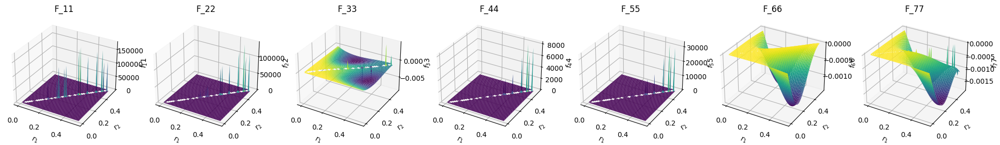

In [ ]:
fig = plt.figure(figsize=(25, 12))

# First 3D plot
ax1 = fig.add_subplot(171, projection='3d')
ax1.plot_surface(R1, R2 , F_11_3d , cmap='viridis')
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$r_2$')
ax1.set_zlabel('$f_11$')
ax1.set_title('F_11')

# Second 3D plot
ax2 = fig.add_subplot(172, projection='3d')
ax2.plot_surface(R1, R2 , F_22_3d , cmap='viridis')
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$r_2$')
ax2.set_zlabel('$f_22$')
ax2.set_title('F_22')

# Third 3D plot
ax3 = fig.add_subplot(173, projection='3d')
ax3.plot_surface(R1, R2 , F_33_3d , cmap='viridis')
ax3.set_xlabel('$r_1$')
ax3.set_ylabel('$r_2$')
ax3.set_zlabel('$f_33$')
ax3.set_title('F_33')

# Fourth 3D plot
ax4 = fig.add_subplot(174, projection='3d')
ax4.plot_surface(R1, R2 , F_44_3d , cmap='viridis')
ax4.set_xlabel('$r_1$')
ax4.set_ylabel('$r_2$')
ax4.set_zlabel('$f_44$')
ax4.set_title('F_44')

# Fifth 3D plot
ax5 = fig.add_subplot(175, projection='3d')
ax5.plot_surface(R1, R2 , F_55_3d , cmap='viridis')
ax5.set_xlabel('$r_1$')
ax5.set_ylabel('$r_2$')
ax5.set_zlabel('$f_55$')
ax5.set_title('F_55')

# Sixth 3D plot
ax6 = fig.add_subplot(176, projection='3d')
ax6.plot_surface(R1, R2 , F_66_3d , cmap='viridis')
ax6.set_xlabel('$r_1$')
ax6.set_ylabel('$r_2$')
ax6.set_zlabel('$f_66$')
ax6.set_title('F_66')

# Seventh 3D plot
ax7 = fig.add_subplot(177, projection='3d')
ax7.plot_surface(R1, R2 , F_77_3d , cmap='viridis')
ax7.set_xlabel('$r_1$')
ax7.set_ylabel('$r_2$')
ax7.set_zlabel('$f_77$')
ax7.set_title('F_77')

# fig.savefig('3d_plots_diagonal_terms.pdf')
# pdf_3d.savefig(fig)

plt.show()

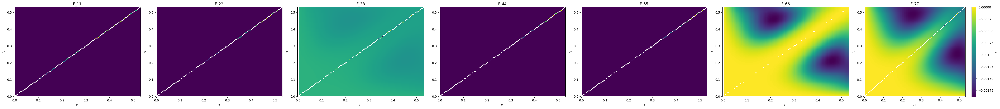

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(45, 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [F_11_3d, F_22_3d, F_33_3d, F_44_3d, F_55_3d, F_66_3d, F_77_3d]
titles = ['F_11', 'F_22', 'F_33', 'F_44', 'F_55', 'F_66', 'F_77']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    ax.set_title(titles[i])
    ax.set_xlabel('$r_1$')
    ax.set_ylabel('$r_2$')
    # Use pcolormesh to plot the data
    im = ax.pcolormesh(R1, R2, functions[i], cmap= 'viridis', shading = 'auto')

# Add a colorbar for the first surface
plt.colorbar(im, label='f')

# Adjust layout
plt.tight_layout()

# pdf_cplot.savefig(fig)

# Show the plots
plt.show()

<lambdifygenerated-9>:2: RuntimeWarning: invalid value encountered in divide
  return r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2))*exp(-4*r1 - 4*r2) + r1**2*r2**2*(r1**2 + r2**2)*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 -

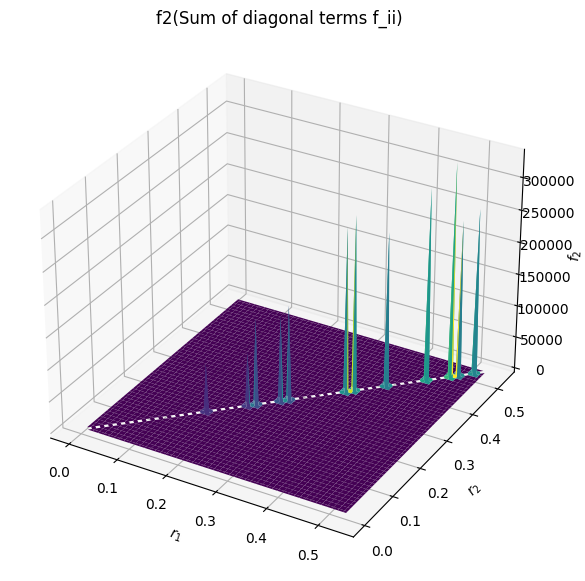

In [ ]:
F2_3d = F2(R1,Theta1, Phi1, R2, Theta2, Phi2)
F2_2d = F2(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

fig = plt.figure(figsize=(10, 7))

# Second 3D plot
ax = fig.add_subplot(projection='3d')
ax.plot_surface(R1, R2 , F2_3d , cmap='viridis')
ax.set_xlabel('$r_1$')
ax.set_ylabel('$r_2$')
ax.set_zlabel('$f_2$')
ax.set_title('f2(Sum of diagonal terms f_ii)')

# pdf_3d.savefig(fig)

plt.show()

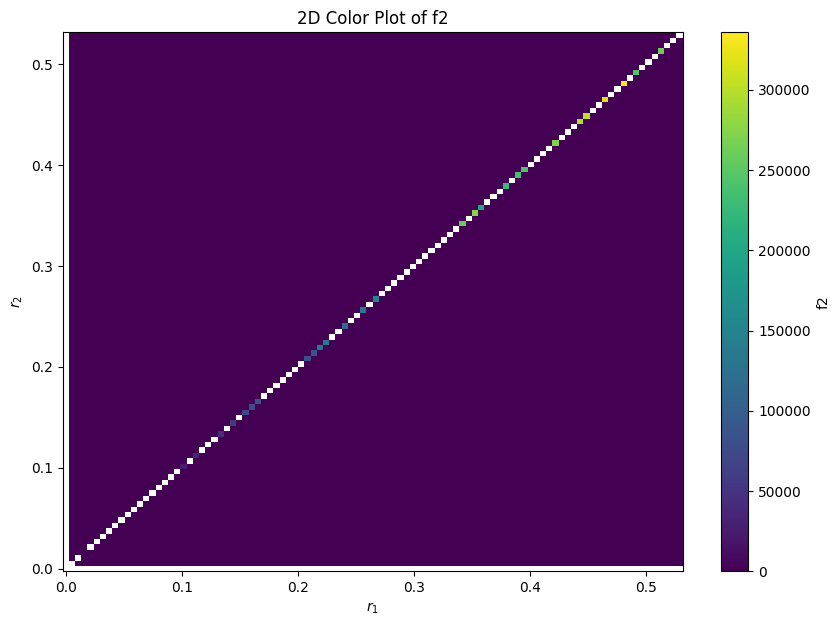

In [ ]:
plt.figure(figsize=(10,7))
plt.pcolormesh(R1, R2, F2_3d, shading='auto', cmap='viridis')
plt.colorbar(label='f2')
plt.xlabel('$r_1$')
plt.ylabel('$r_2$')
plt.title('2D Color Plot of f2')

# pdf_cplot.savefig(fig)
plt.show()

The diagonal terms $f_ii$ are plotted against r_1 (2d plotting), keeping other values as constant for better understanding. Here $r_2 = 0.108$, $\theta_1 = \pi/4$, $\theta_2 = \pi/6$, $\phi_1 = \pi/3$ and $\phi_2 = \pi/5$.

In [ ]:
F_11_2d = f_11_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_22_2d = f_22_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_33_2d = f_33_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_44_2d = f_44_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_55_2d = f_55_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_66_2d = f_66_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_77_2d = f_77_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

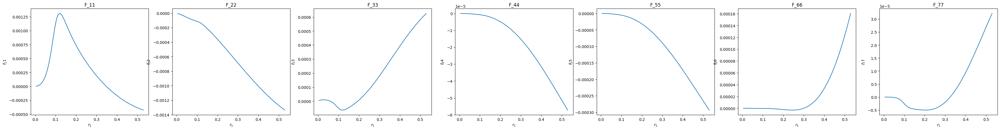

In [ ]:
fig = plt.figure(figsize=(45, 5))

# First 2D plot
ax1 = fig.add_subplot(171)
ax1.plot(r1 , F_11_2d)
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$f_11$')
ax1.set_title('F_11')

# Second 2D plot
ax2 = fig.add_subplot(172)
ax2.plot(r1, F_22_2d)
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$f_22$')
ax2.set_title('F_22')

# Third 2D plot
ax3 = fig.add_subplot(173)
ax3.plot(r1, F_33_2d)
ax3.set_xlabel('$r_1$')
ax3.set_ylabel('$f_33$')
ax3.set_title('F_33')

# Fourth 2D plot
ax4 = fig.add_subplot(174)
ax4.plot(r1, F_44_2d)
ax4.set_xlabel('$r_1$')
ax4.set_ylabel('$f_44$')
ax4.set_title('F_44')

# Fifth 2D plot
ax5 = fig.add_subplot(175)
ax5.plot(r1, F_55_2d)
ax5.set_xlabel('$r_1$')
ax5.set_ylabel('$f_55$')
ax5.set_title('F_55')

# Sixth 2D plot
ax6 = fig.add_subplot(176)
ax6.plot(r1 , F_66_2d)
ax6.set_xlabel('$r_1$')
ax6.set_ylabel('$f_66$')
ax6.set_title('F_66')

# Seventh 2D plot
ax7 = fig.add_subplot(177)
ax7.plot(r1 , F_77_2d)
ax7.set_xlabel('$r_1$')
ax7.set_ylabel('$f_77$')
ax7.set_title('F_77')

# pdf_2d.savefig(fig)
plt.show()

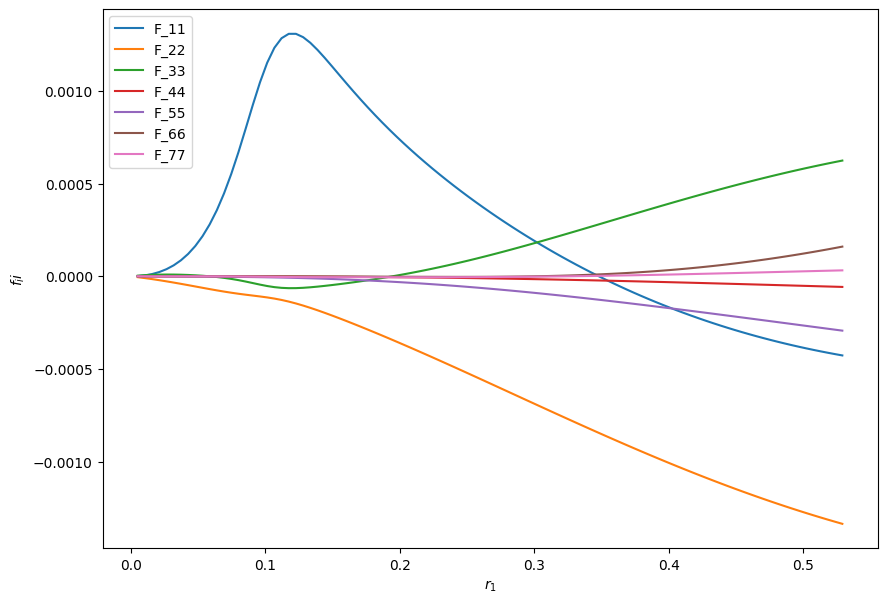

In [ ]:
fig = plt.figure(figsize=(10, 7))

ax = fig.add_subplot()
ax.plot(r1 , F_11_2d, label = 'F_11')
ax.plot(r1 , F_22_2d, label = 'F_22')
ax.plot(r1 , F_33_2d, label = 'F_33')
ax.plot(r1 , F_44_2d, label = 'F_44')
ax.plot(r1 , F_55_2d, label = 'F_55')
ax.plot(r1 , F_66_2d, label = 'F_66')
ax.plot(r1 , F_77_2d, label = 'F_77')
ax.set_xlabel('$r_1$')
ax.set_ylabel('$f_ii$')

ax.legend()
# pdf_2d.savefig(fig)

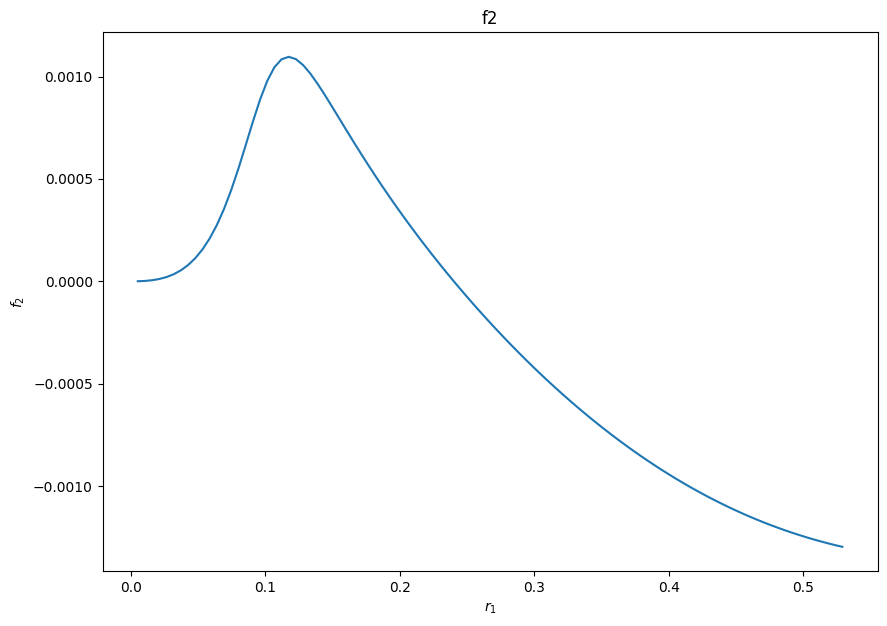

In [ ]:
fig = plt.figure(figsize=(10, 7))

# Second 3D plot
ax = fig.add_subplot()
ax.plot(r1 , F2_2d)
ax.set_xlabel('$r_1$')
ax.set_ylabel('$f_2$')
ax.set_title('f2')

# pdf_2d.savefig(fig)
plt.show()

In [ ]:
r1, r2 = smp.symbols('r1 r2 ', real=True, positive=True)
theta = smp.symbols('theta')
theta1, phi1 = smp.symbols('theta_1 phi_1')
theta2, phi2 = smp.symbols('theta_2 phi_2')

f_12 = f_12.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_13 = f_13.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_14 = f_14.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_15 = f_15.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_16 = f_16.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_17 = f_17.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

f_23 = f_23.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_24 = f_24.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_25 = f_25.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_26 = f_26.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_27 = f_27.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

f_34 = f_34.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_35 = f_35.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_36 = f_36.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_37 = f_37.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

f_45 = f_45.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_46 = f_46.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_47 = f_47.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

f_56 = f_56.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)
f_57 = f_57.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

f_67 = f_67.subs(smp.sin(theta), sin_theta).subs(smp.cos(theta), cos_theta)

In [ ]:
f_12_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_12)
f_13_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_13)
f_14_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_14)
f_15_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_15)
f_16_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_16)
f_17_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_17)

f_23_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_23)
f_24_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_24)
f_25_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_25)
f_26_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_26)
f_27_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_27)

f_34_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_34)
f_35_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_35)
f_36_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_36)
f_37_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_37)

f_45_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_45)
f_46_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_46)
f_47_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_47)

f_56_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_56)
f_57_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_57)
f_67_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], f_67)

In [ ]:
r1 = np.linspace(0, 0.529, 100)
r2 = np.linspace(0, 0.529, 100)

theta1 = np.linspace(0, np.pi, 100)
theta2 = np.linspace(0, np.pi, 100)

phi1 = np.linspace(0, 2*np.pi, 100)
phi2 = np.linspace(0, 2*np.pi, 100)

R1, R2 = np.meshgrid(r1, r2)
Theta1, Theta2 = np.meshgrid(theta1, theta2)
Phi1, Phi2 = np.meshgrid(phi1, phi2)

In [ ]:
F_12_3d = f_12_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_13_3d = f_13_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_14_3d = f_14_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_15_3d = f_15_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_16_3d = f_16_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_17_3d = f_17_f(R1,Theta1, Phi1, R2, Theta2, Phi2)

F_23_3d = f_23_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_24_3d = f_24_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_25_3d = f_25_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_26_3d = f_26_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_27_3d = f_27_f(R1,Theta1, Phi1, R2, Theta2, Phi2)

F_34_3d = f_34_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_35_3d = f_35_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_36_3d = f_36_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_37_3d = f_37_f(R1,Theta1, Phi1, R2, Theta2, Phi2)

F_45_3d = f_45_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_46_3d = f_46_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_47_3d = f_47_f(R1,Theta1, Phi1, R2, Theta2, Phi2)

F_56_3d = f_56_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_57_3d = f_57_f(R1,Theta1, Phi1, R2, Theta2, Phi2)
F_67_3d = f_67_f(R1,Theta1, Phi1, R2, Theta2, Phi2)

<lambdifygenerated-10>:2: RuntimeWarning: invalid value encountered in divide
  return -r1*r2*(4.0*r1**2*r2 - 1.0*r1**2*r2/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2) + 4.0*r1*r2**2 - 1.0*r1*r2**2/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2) - 4.0*r1*r2 + 1.0*r1 + 1.0*r2)*exp(-4*r1 - 4*r2)
<lambdifygenerated-10>:2: 

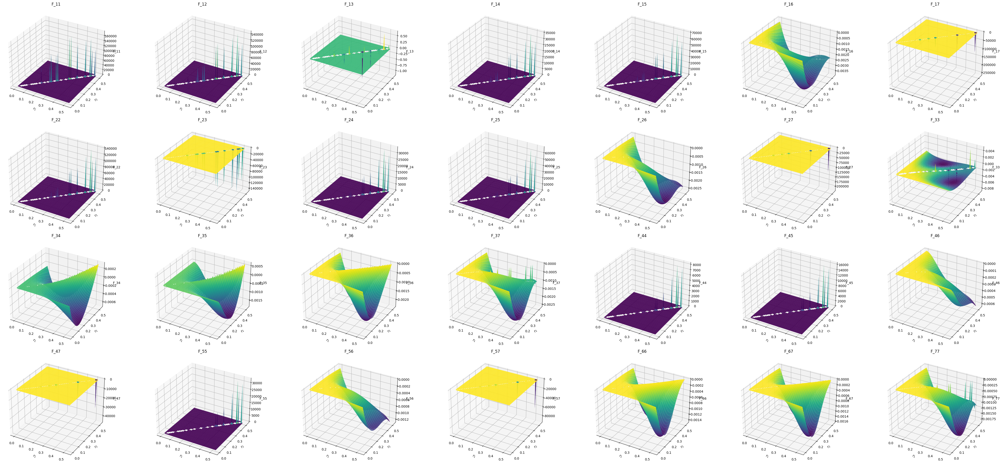

In [ ]:
fig, axes = plt.subplots(4, 7, figsize=(45,20), subplot_kw={'projection': '3d'})

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [F_11_3d, F_12_3d, F_13_3d, F_14_3d, F_15_3d, F_16_3d, F_17_3d, F_22_3d, F_23_3d, F_24_3d, F_25_3d, F_26_3d, F_27_3d, F_33_3d, F_34_3d, F_35_3d, F_36_3d, F_37_3d,
             F_44_3d, F_45_3d, F_46_3d, F_47_3d, F_55_3d, F_56_3d, F_57_3d, F_66_3d, F_67_3d, F_77_3d]
titles = ['F_11', 'F_12', 'F_13', 'F_14', 'F_15', 'F_16', 'F_17', 'F_22', 'F_23', 'F_24', 'F_25', 'F_26', 'F_27', 'F_33', 'F_34',
          'F_35', 'F_36', 'F_37', 'F_44', 'F_45', 'F_46', 'F_47', 'F_55', 'F_56', 'F_57', 'F_66', 'F_67', 'F_77']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    # ax = fig.add_subplot(projection='3d')
    ax.plot_surface(R1, R2 , functions[i] , cmap='viridis')
    ax.set_xlabel('$r_1$')
    ax.set_ylabel('$r_2$')
    ax.set_zlabel(titles[i])
    ax.set_title(titles[i])

# Adjust layout
plt.tight_layout()

# pdf_3d.savefig(fig)

# Show the plots
plt.show()

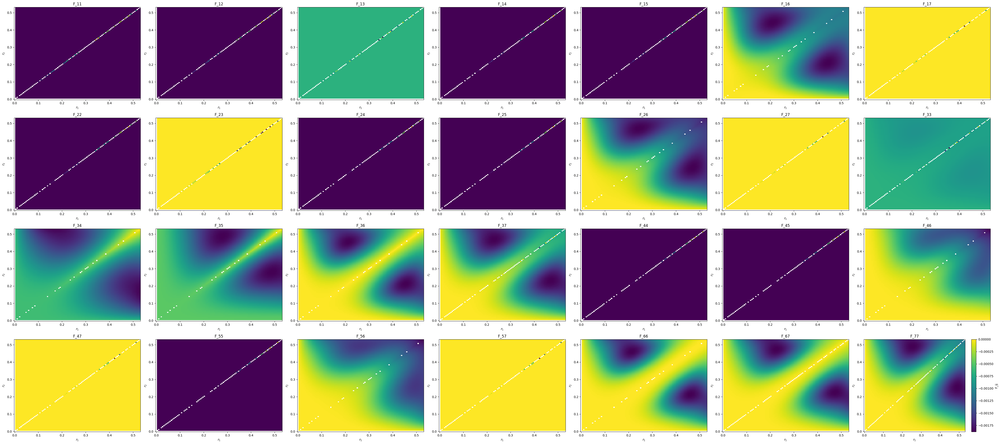

In [ ]:
fig, axes = plt.subplots(4, 7, figsize=(45, 20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [F_11_3d, F_12_3d, F_13_3d, F_14_3d, F_15_3d, F_16_3d, F_17_3d, F_22_3d, F_23_3d, F_24_3d, F_25_3d, F_26_3d, F_27_3d, F_33_3d, F_34_3d, F_35_3d, F_36_3d, F_37_3d,
             F_44_3d, F_45_3d, F_46_3d, F_47_3d, F_55_3d, F_56_3d, F_57_3d, F_66_3d, F_67_3d, F_77_3d]
titles = ['F_11', 'F_12', 'F_13', 'F_14', 'F_15', 'F_16', 'F_17', 'F_22', 'F_23', 'F_24', 'F_25', 'F_26', 'F_27', 'F_33', 'F_34',
          'F_35', 'F_36', 'F_37', 'F_44', 'F_45', 'F_46', 'F_47', 'F_55', 'F_56', 'F_57', 'F_66', 'F_67', 'F_77']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    ax.set_title(titles[i])
    ax.set_xlabel('$r_1$')
    ax.set_ylabel('$r_2$')
    # Use pcolormesh to plot the data
    im = ax.pcolormesh(R1, R2, functions[i], cmap= 'viridis', shading = 'auto')

# Add a colorbar for the first surface
plt.colorbar(im, label='F_ij')

# Adjust layout
plt.tight_layout()

# pdf_cplot.savefig(fig)

# Show the plots
plt.show()

<lambdifygenerated-8>:2: RuntimeWarning: invalid value encountered in divide
  return r1**3*r2**3*(-4.0*r1**2 + 1.0*r1**2/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2) + 4.0*r1 - 4.0*r2**2 + 1.0*r2**2/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2) + 4.0*r2 - 6.0)*exp(-4*r1 - 4*r2) + r1**2*r2**2*(-4.0 + 1.0/sqrt(r1**2 - 

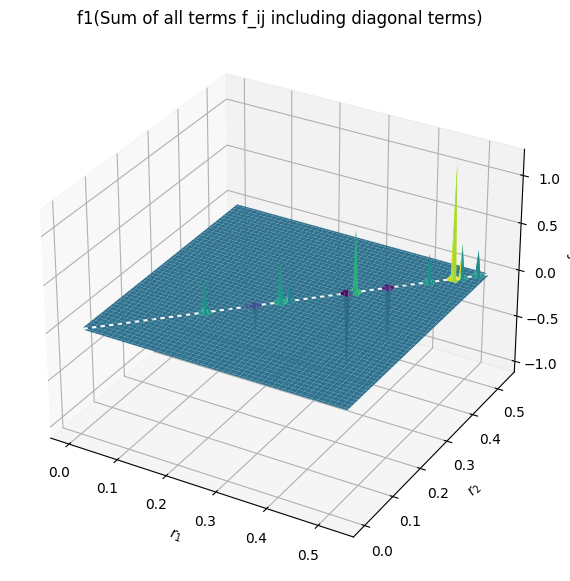

In [ ]:
F1_3d = F1(R1,Theta1, Phi1, R2, Theta2, Phi2)
F1_2d = F1(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

fig = plt.figure(figsize=(10, 7))

# Second 3D plot
ax = fig.add_subplot(projection='3d')
ax.plot_surface(R1, R2 , F1_3d , cmap='viridis')
ax.set_xlabel('$r_1$')
ax.set_ylabel('$r_2$')
ax.set_zlabel('$f_1$')
ax.set_title('f1(Sum of all terms f_ij including diagonal terms)')

# pdf_3d.savefig(fig)

plt.show()

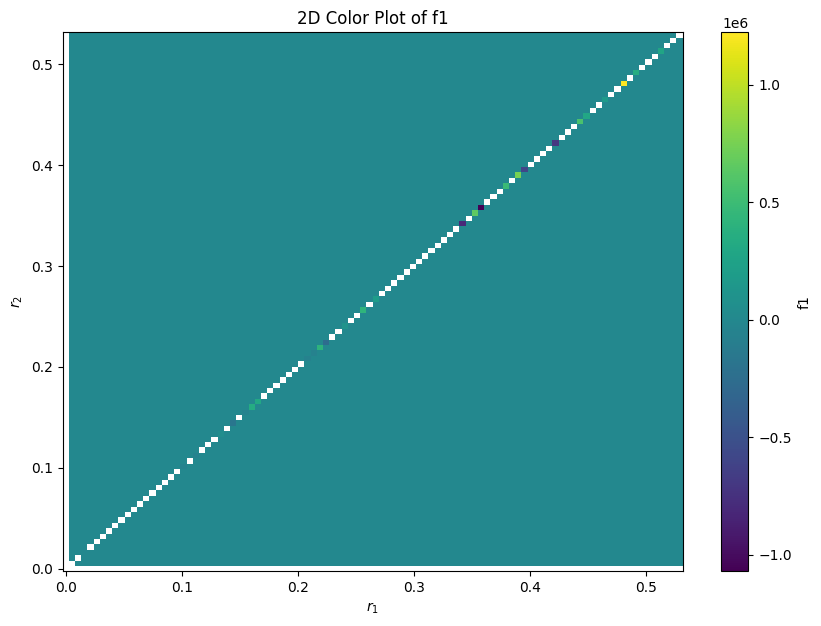

In [ ]:
plt.figure(figsize=(10,7))
plt.pcolormesh(R1, R2, F1_3d, shading='auto', cmap='viridis')
plt.colorbar(label='f1')
plt.xlabel('$r_1$')
plt.ylabel('$r_2$')
plt.title('2D Color Plot of f1')

# pdf_cplot.savefig(fig)
plt.show()

In [ ]:
F_12_2d = f_12_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_13_2d = f_13_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_14_2d = f_14_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_15_2d = f_15_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_16_2d = f_16_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_17_2d = f_17_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

F_23_2d = f_23_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_24_2d = f_24_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_25_2d = f_25_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_26_2d = f_26_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_27_2d = f_27_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

F_34_2d = f_34_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_35_2d = f_35_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_36_2d = f_36_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_37_2d = f_37_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

F_45_2d = f_45_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_46_2d = f_46_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_47_2d = f_47_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

F_56_2d = f_56_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_57_2d = f_57_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
F_67_2d = f_67_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

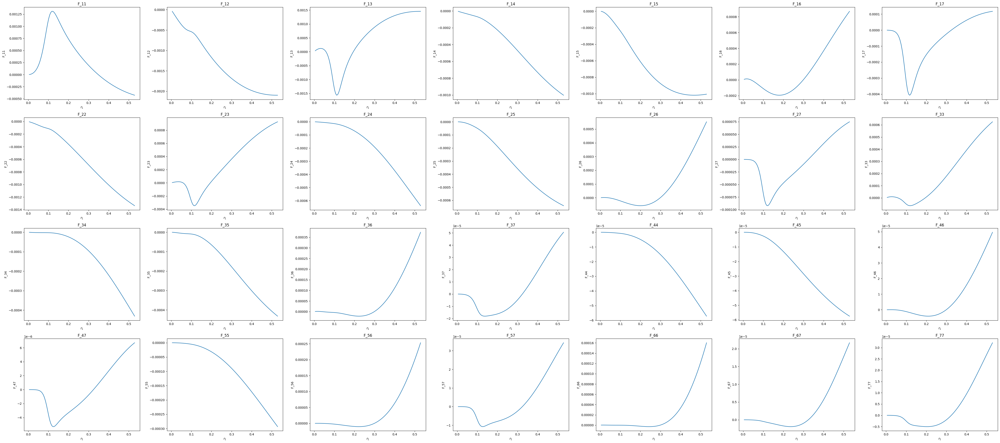

In [ ]:
fig, axes = plt.subplots(4, 7, figsize=(45,20))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [F_11_2d, F_12_2d, F_13_2d, F_14_2d, F_15_2d, F_16_2d, F_17_2d, F_22_2d, F_23_2d, F_24_2d, F_25_2d, F_26_2d, F_27_2d, F_33_2d, F_34_2d, F_35_2d, F_36_2d, F_37_2d,
             F_44_2d, F_45_2d, F_46_2d, F_47_2d, F_55_2d, F_56_2d, F_57_2d, F_66_2d, F_67_2d, F_77_2d]
titles = ['F_11', 'F_12', 'F_13', 'F_14', 'F_15', 'F_16', 'F_17', 'F_22', 'F_23', 'F_24', 'F_25', 'F_26', 'F_27', 'F_33', 'F_34',
          'F_35', 'F_36', 'F_37', 'F_44', 'F_45', 'F_46', 'F_47', 'F_55', 'F_56', 'F_57', 'F_66', 'F_67', 'F_77']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    # ax = fig.add_subplot(projection='3d')
    ax.plot(r1 , functions[i])
    ax.set_xlabel('$r_1$')
    ax.set_ylabel(titles[i])
    ax.set_title(titles[i])

# Adjust layout
plt.tight_layout()

# pdf_2d.savefig(fig)
# Show the plots
plt.show()

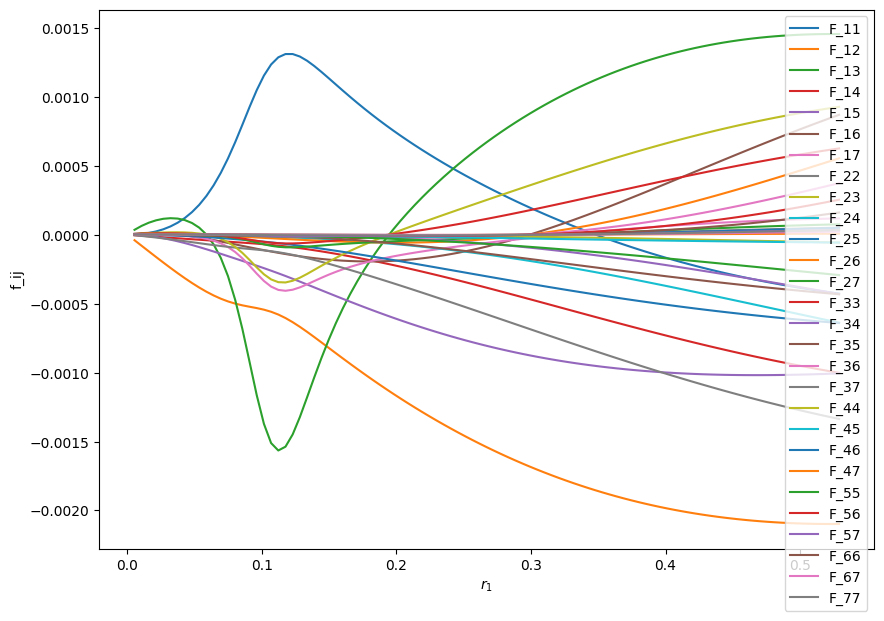

In [ ]:
fig = plt.figure(figsize=(10, 7))

ax = fig.add_subplot()
ax.plot(r1 , F_11_2d, label = 'F_11')
ax.plot(r1 , F_12_2d, label = 'F_12')
ax.plot(r1 , F_13_2d, label = 'F_13')
ax.plot(r1 , F_14_2d, label = 'F_14')
ax.plot(r1 , F_15_2d, label = 'F_15')
ax.plot(r1 , F_16_2d, label = 'F_16')
ax.plot(r1 , F_17_2d, label = 'F_17')

ax.plot(r1 , F_22_2d, label = 'F_22')
ax.plot(r1 , F_23_2d, label = 'F_23')
ax.plot(r1 , F_24_2d, label = 'F_24')
ax.plot(r1 , F_25_2d, label = 'F_25')
ax.plot(r1 , F_26_2d, label = 'F_26')
ax.plot(r1 , F_27_2d, label = 'F_27')

ax.plot(r1 , F_33_2d, label = 'F_33')
ax.plot(r1 , F_34_2d, label = 'F_34')
ax.plot(r1 , F_35_2d, label = 'F_35')
ax.plot(r1 , F_36_2d, label = 'F_36')
ax.plot(r1 , F_37_2d, label = 'F_37')

ax.plot(r1 , F_44_2d, label = 'F_44')
ax.plot(r1 , F_45_2d, label = 'F_45')
ax.plot(r1 , F_46_2d, label = 'F_46')
ax.plot(r1 , F_47_2d, label = 'F_47')

ax.plot(r1 , F_55_2d, label = 'F_55')
ax.plot(r1 , F_56_2d, label = 'F_56')
ax.plot(r1 , F_57_2d, label = 'F_57')

ax.plot(r1 , F_66_2d, label = 'F_66')
ax.plot(r1 , F_67_2d, label = 'F_67')
ax.plot(r1 , F_77_2d, label = 'F_77')

ax.set_xlabel('$r_1$')
ax.set_ylabel('f_ij')

ax.legend()

# pdf_2d.savefig(fig)

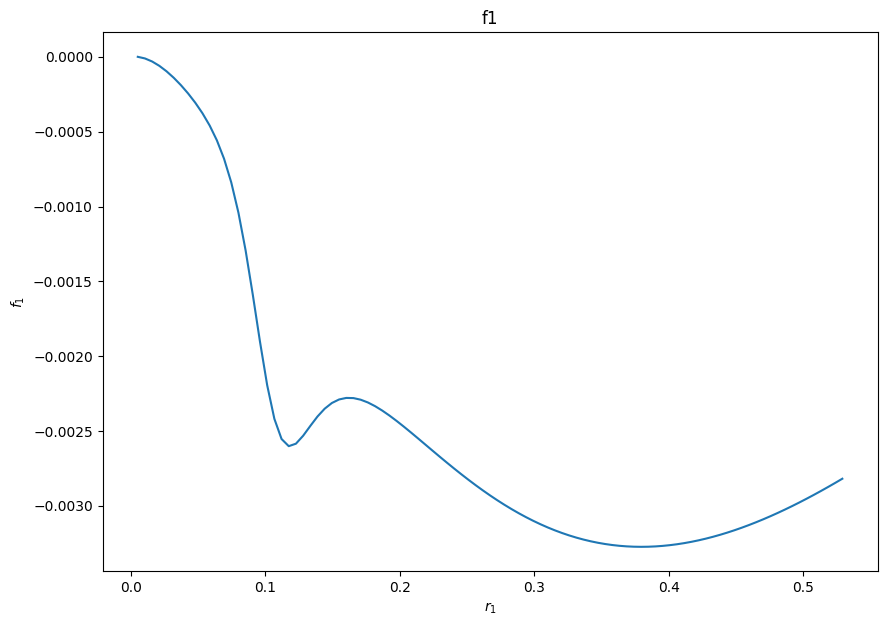

In [ ]:
fig = plt.figure(figsize=(10, 7))

# Second 3D plot
ax = fig.add_subplot()
ax.plot(r1 , F1_2d)
ax.set_xlabel('$r_1$')
ax.set_ylabel('$f_1$')
ax.set_title('f1')

# pdf_2d.savefig(fig)
plt.show()

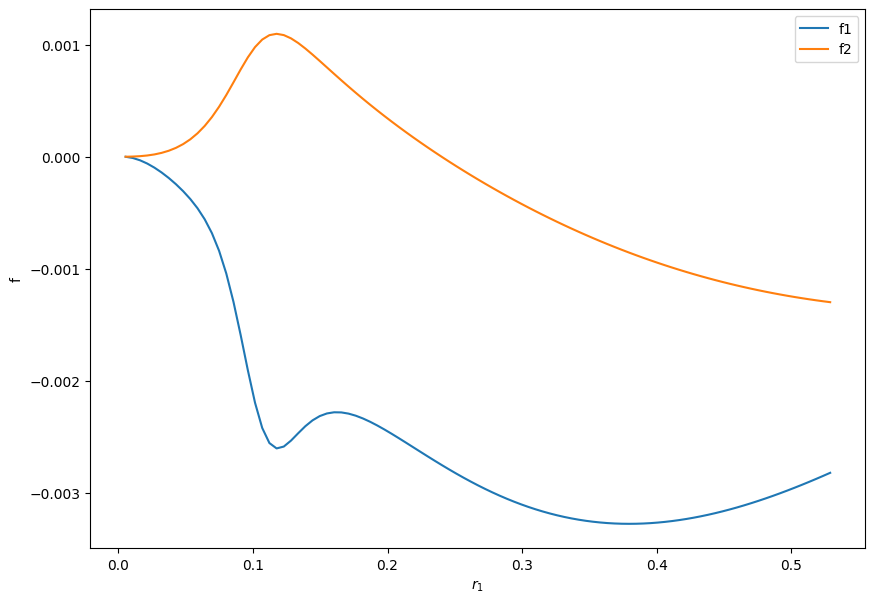

In [ ]:
fig = plt.figure(figsize=(10, 7))

ax = fig.add_subplot()
ax.plot(r1, F1_2d, label='f1')
ax.plot(r2, F2_2d, label='f2')
ax.set_xlabel('$r_1$')
ax.set_ylabel('f')

ax.legend()
# pdf_2d.savefig(fig)

In [ ]:
r1, r2 = smp.symbols('r1 r2 ', real=True, positive=True)
theta = smp.symbols('theta')
theta1, phi1 = smp.symbols('theta_1 phi_1')
theta2, phi2 = smp.symbols('theta_2 phi_2')

Here I defined all the sampling functions $P_{ii}$ corresponding to the functions $f_{ii}$. The sampling functions $P_{ii}$ defined here are guessed based on the common factor we got from the $f_{ii}$ functions and the order of the terms present in $f_{ii}$ functions. For example, in $f_{11}$, $ r_1^2 r_2^2 e^{-4(r_1 + r_2)}$ was the common factor and terms present in $f_{11}$ were of order 3 and 4 (in $r_1$ and $r_2$). Similarly the sampling functions corresponding to other diagonal functions $f_{ii}$ were found. The overall Sampling function is the sum of all the $P_{ii}$ functions.

In [ ]:
P_11 = r1**2 * r2**2 * smp.exp(-4 * (r1 + r2)) * (1/absolute_diff - 1)

P_22 = r1 * r2 * (r1 + r2) * smp.exp(-4 * (r1 + r2)) * (r1 + r2 - r1*r2 + ((r1**2 * r2**2)/(absolute_diff)))

P_33 = ( r1*r2 * smp.exp(-4 * (r1 + r2)) / absolute_diff**2 ) * (- r1*r2 * (r1**2 + r2**2) * absolute_diff**2 + absolute_diff**2 * (r1 + r2) * r1*r2 - absolute_diff**2 * r1*r2)
# P_33 = - ( r1*r2 * smp.exp(-4 * (r1 + r2)) / absolute_diff**2 ) * (- r1*r2 * (r1**2 + r2**2) * absolute_diff**2 + absolute_diff**2 * (r1 + r2) * r1*r2 - absolute_diff**2 * (r1**2 + r2**2))


P_44 = r1**2 * r2**2 * smp.exp(-4 * (r1 + r2)) * (-(r1**2 + r2**2) - r1**2 * r2**2 + r1**2 * r2**2/absolute_diff )

P_55 = r1**2 * r2**2 * (r1**2 + r2**2) * smp.exp(-4 * (r1 + r2)) * (- (r1**2 + r2**2) - 1 + (r1**2 + r2**2)/absolute_diff)
# # P_55 = r1**2 * r2**2 * (r1**2 + r2**2) * smp.exp(-4 * (r1 + r2)) * (- (r1**2 + r2**2) - 1 + (r1*r2)/absolute_diff)
# P_55 = r1**2 * r2**2 * (r1**2 + r2**2) * smp.exp(-4 * (r1 + r2)) * (- (r1*r2) - 1 + (r1**2 + r2**2)/absolute_diff)

P_66 = r1 * r2 * absolute_diff**2 * smp.exp(-4 * (r1 + r2)) * (- (r1**2 + r2**2) * r1*r2 + r1*r2 * (r1 + r2) + r1*r2 * absolute_diff + r1**2 + r2**2)

P_77 = ((r1*r2 * (r1 + r2))/(absolute_diff**2)) * smp.exp(-4 * (r1 + r2)) * (-(r1**2 + r2**2) * absolute_diff**2 * (r1 + r2) + absolute_diff**4 * r1*r2 - absolute_diff**6 * (r1 + r2))

In [ ]:
P_11

r1**2*r2**2*(-1 + 1/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2)

In [ ]:
P_22

r1*r2*(r1 + r2)*(r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - r1*r2 + r1 + r2)*exp(-4*r1 - 4*r2)

In [ ]:
P_33

r1*r2*(r1*r2*(r1 + r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - r1*r2*(r1**2 + r2**2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2))*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)

In [ ]:
P_44

r1**2*r2**2*(-r1**2*r2**2 + r1**2*r2**2/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - r1**2 - r2**2)*exp(-4*r1 - 4*r2)

In [ ]:
P_55

r1**2*r2**2*(r1**2 + r2**2)*(-r1**2 - r2**2 + (r1**2 + r2**2)/sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) - 1)*exp(-4*r1 - 4*r2)

In [ ]:
P_66

r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)*(r1**2 + r1*r2*(r1 + r2) + r1*r2*(-r1**2 - r2**2) + r1*r2*sqrt(r1**2 - 2*r1*r2*cos(theta) + r2**2) + r2**2)*exp(-4*r1 - 4*r2)

In [ ]:
P_77

r1*r2*(r1 + r2)*(r1*r2*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**2 + (r1 + r2)*(-r1**2 - r2**2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2) - (r1 + r2)*(r1**2 - 2*r1*r2*cos(theta) + r2**2)**3)*exp(-4*r1 - 4*r2)/(r1**2 - 2*r1*r2*cos(theta) + r2**2)

In [ ]:
Sampling_function = (P_11 + P_22 + P_33 + P_44 + P_55 + P_66 + P_77).simplify()

In [ ]:
P_11 = P_11.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
P_22 = P_22.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
P_33 = P_33.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
P_44 = P_44.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
P_55 = P_55.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
P_66 = P_66.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )
P_77 = P_77.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )

Sampling_function = Sampling_function.subs(smp.cos(theta), cos_theta).subs(smp.sin(theta), sin_theta )

In [ ]:
P_11_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_11)
P_22_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_22)
P_33_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_33)
P_44_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_44)
P_55_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_55)
P_66_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_66)
P_77_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], P_77)

Sampling_function_f = smp.lambdify([r1, theta1, phi1, r2, theta2, phi2], Sampling_function)

In [ ]:
r1 = np.linspace(0, 0.529, 100)
r2 = np.linspace(0, 0.529, 100)

theta1 = np.linspace(0, np.pi, 100)
theta2 = np.linspace(0, np.pi, 100)

phi1 = np.linspace(0, 2*np.pi, 100)
phi2 = np.linspace(0, 2*np.pi, 100)

R1, R2 = np.meshgrid(r1, r2)
Theta1, Theta2 = np.meshgrid(theta1, theta2)
Phi1, Phi2 = np.meshgrid(phi1, phi2)

In [ ]:
P_11_3d = P_11_f(R1, Theta1, Phi1, R2, Theta2, Phi2)
P_22_3d = P_22_f(R1, Theta1, Phi1, R2, Theta2, Phi2)
P_33_3d = P_33_f(R1, Theta1, Phi1, R2, Theta2, Phi2)
P_44_3d = P_44_f(R1, Theta1, Phi1, R2, Theta2, Phi2)
P_55_3d = P_55_f(R1, Theta1, Phi1, R2, Theta2, Phi2)
P_66_3d = P_66_f(R1, Theta1, Phi1, R2, Theta2, Phi2)
P_77_3d = P_77_f(R1, Theta1, Phi1, R2, Theta2, Phi2)

Sampling_function_3d = Sampling_function_f(R1, Theta1, Phi1, R2, Theta2, Phi2)

<lambdifygenerated-31>:2: RuntimeWarning: invalid value encountered in divide
  return r1**2*r2**2*(-1 + 1/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**2))*exp(-4*r1 - 4*r2)
<lambdifygenerated-31>:2: RuntimeWarning: invalid value encountered in sqrt
  return r1**2*r2**2*(-1 + 1/sqrt(r1**2 - 2*r1*r2*(r1*r2*sin(phi_1)*sin(phi_2)*sin(theta_1)*sin(theta_2) + r1*r2*sin(theta_1)*sin(theta_2)*cos(phi_1)*cos(phi_2) + r1*r2*cos(theta_1)*cos(theta_2))/(sqrt(r1**2*sin(phi_1)**2*sin(theta_1)**2 + r1**2*sin(theta_1)**2*cos(phi_1)**2 + r1**2*cos(theta_1)**2)*sqrt(r2**2*sin(phi_2)**2*sin(theta_2)**2 + r2**2*sin(theta_2)**2*cos(phi_2)**2 + r2**2*cos(theta_2)**2)) + r2**

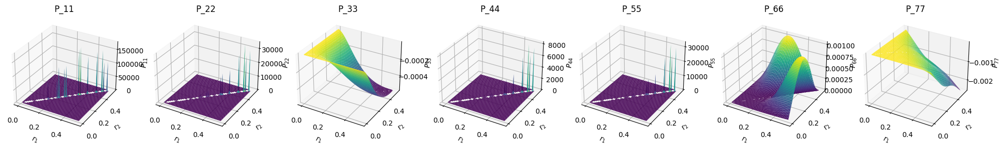

In [ ]:
fig = plt.figure(figsize=(25, 12))

# First 3D plot
ax1 = fig.add_subplot(171, projection='3d')
ax1.plot_surface(R1, R2 , P_11_3d , cmap='viridis')
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$r_2$')
ax1.set_zlabel('$P_{11}$')
ax1.set_title('P_11')

# Second 3D plot
ax2 = fig.add_subplot(172, projection='3d')
ax2.plot_surface(R1, R2 , P_22_3d , cmap='viridis')
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$r_2$')
ax2.set_zlabel('$P_{22}$')
ax2.set_title('P_22')

# Third 3D plot
ax3 = fig.add_subplot(173, projection='3d')
ax3.plot_surface(R1, R2 , P_33_3d , cmap='viridis')
ax3.set_xlabel('$r_1$')
ax3.set_ylabel('$r_2$')
ax3.set_zlabel('$P_{33}$')
ax3.set_title('P_33')

# Fourth 3D plot
ax4 = fig.add_subplot(174, projection='3d')
ax4.plot_surface(R1, R2 , P_44_3d , cmap='viridis')
ax4.set_xlabel('$r_1$')
ax4.set_ylabel('$r_2$')
ax4.set_zlabel('$P_{44}$')
ax4.set_title('P_44')

# Fifth 3D plot
ax5 = fig.add_subplot(175, projection='3d')
ax5.plot_surface(R1, R2 , P_55_3d , cmap='viridis')
ax5.set_xlabel('$r_1$')
ax5.set_ylabel('$r_2$')
ax5.set_zlabel('$P_{55}$')
ax5.set_title('P_55')

# Sixth 3D plot
ax6 = fig.add_subplot(176, projection='3d')
ax6.plot_surface(R1, R2 , P_66_3d , cmap='viridis')
ax6.set_xlabel('$r_1$')
ax6.set_ylabel('$r_2$')
ax6.set_zlabel('$P_{66}$')
ax6.set_title('P_66')

# Seventh 3D plot
ax7 = fig.add_subplot(177, projection='3d')
ax7.plot_surface(R1, R2 , P_77_3d , cmap='viridis')
ax7.set_xlabel('$r_1$')
ax7.set_ylabel('$r_2$')
ax7.set_zlabel('$P_{77}$')
ax7.set_title('P_77')


# pdf_3d.savefig(fig)

plt.show()

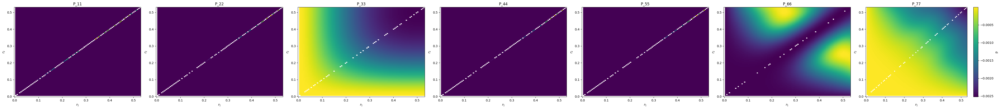

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(45, 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [P_11_3d, P_22_3d, P_33_3d, P_44_3d, P_55_3d, P_66_3d, P_77_3d]
titles = ['P_11', 'P_22', 'P_33', 'P_44', 'P_55', 'P_66', 'P_77']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    ax.set_title(titles[i])
    ax.set_xlabel('$r_1$')
    ax.set_ylabel('$r_2$')
    # Use pcolormesh to plot the data
    im = ax.pcolormesh(R1, R2, functions[i], cmap= 'viridis', shading = 'auto')

# Add a colorbar for the first surface
plt.colorbar(im, label='p')

# Adjust layout
plt.tight_layout()

# pdf_cplot.savefig(fig)

# Show the plots
plt.show()

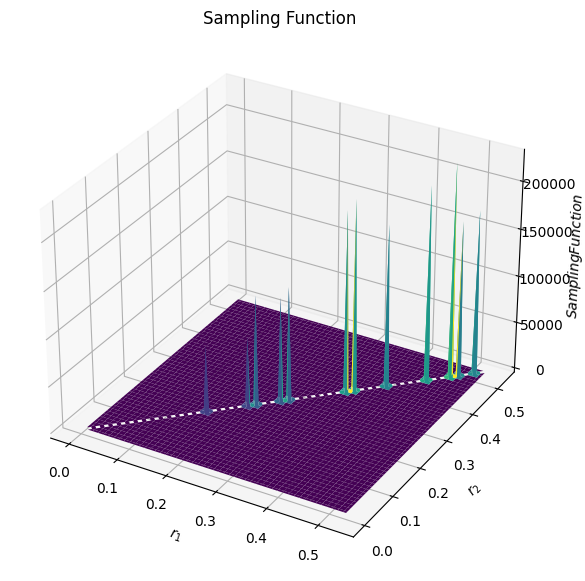

In [ ]:
fig = plt.figure(figsize=(10, 7))

ax = fig.add_subplot(projection='3d')
ax.plot_surface(R1, R2 , Sampling_function_3d , cmap='viridis')
ax.set_xlabel('$r_1$')
ax.set_ylabel('$r_2$')
ax.set_zlabel('$Sampling Function$')
ax.set_title('Sampling Function')

# pdf_3d.savefig(fig)
plt.show()

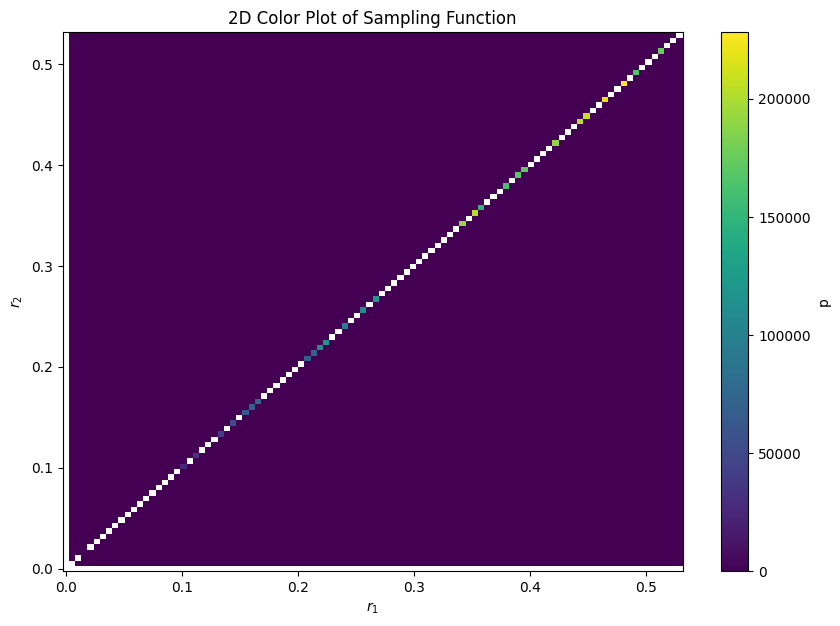

In [ ]:
plt.figure(figsize=(10,7))
plt.pcolormesh(R1, R2, Sampling_function_3d, shading='auto', cmap='viridis')
plt.colorbar(label='p')
plt.xlabel('$r_1$')
plt.ylabel('$r_2$')
plt.title('2D Color Plot of Sampling Function')

# pdf_cplot.savefig(fig)
plt.show()

In [ ]:
P_11_2d = P_11_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
P_22_2d = P_22_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
P_33_2d = P_33_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
P_44_2d = P_44_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
P_55_2d = P_55_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
P_66_2d = P_66_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)
P_77_2d = P_77_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

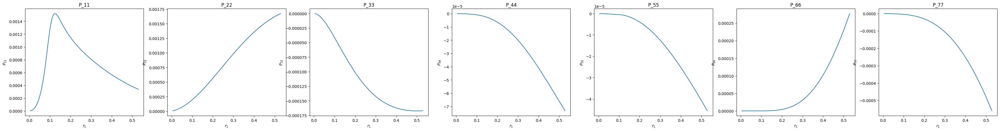

In [ ]:
fig = plt.figure(figsize=(45, 5))

# First 2D plot
ax1 = fig.add_subplot(171)
ax1.plot(r1 , P_11_2d)
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$P_{11}$')
ax1.set_title('P_11')

# Second 2D plot
ax2 = fig.add_subplot(172)
ax2.plot(r1, P_22_2d)
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$P_{22}$')
ax2.set_title('P_22')

# Third 2D plot
ax3 = fig.add_subplot(173)
ax3.plot(r1, P_33_2d)
ax3.set_xlabel('$r_1$')
ax3.set_ylabel('$P_{33}$')
ax3.set_title('P_33')

# Fourth 2D plot
ax4 = fig.add_subplot(174)
ax4.plot(r1, P_44_2d)
ax4.set_xlabel('$r_1$')
ax4.set_ylabel('$P_{44}$')
ax4.set_title('P_44')

# Fifth 2D plot
ax5 = fig.add_subplot(175)
ax5.plot(r1, P_55_2d)
ax5.set_xlabel('$r_1$')
ax5.set_ylabel('$P_{55}$')
ax5.set_title('P_55')

# Sixth 2D plot
ax6 = fig.add_subplot(176)
ax6.plot(r1 , P_66_2d)
ax6.set_xlabel('$r_1$')
ax6.set_ylabel('$P_{66}$')
ax6.set_title('P_66')

# Seventh 2D plot
ax7 = fig.add_subplot(177)
ax7.plot(r1 , P_77_2d)
ax7.set_xlabel('$r_1$')
ax7.set_ylabel('$P_{77}$')
ax7.set_title('P_77')

# pdf_2d.savefig(fig)
plt.show()

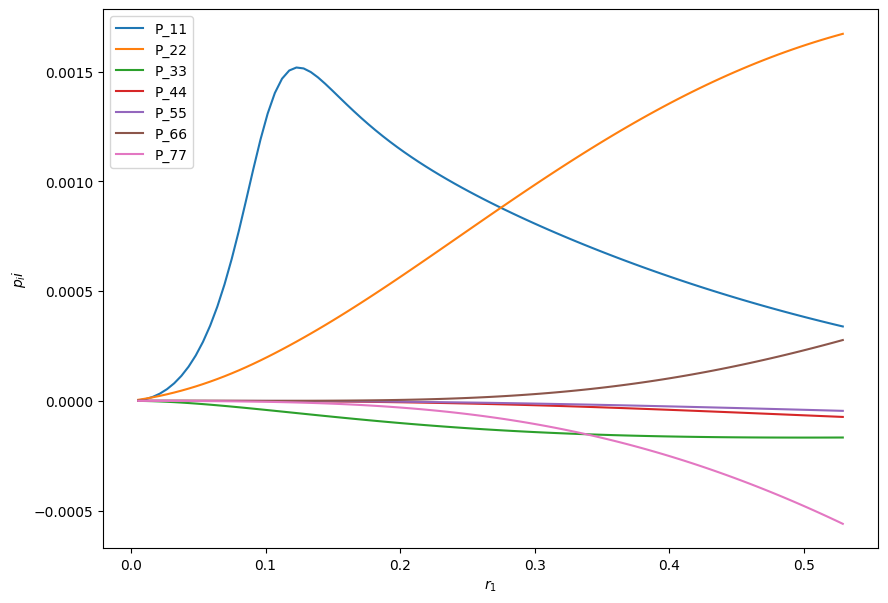

In [ ]:
fig = plt.figure(figsize=(10, 7))

ax = fig.add_subplot()
ax.plot(r1 , P_11_2d, label = 'P_11')
ax.plot(r1 , P_22_2d, label = 'P_22')
ax.plot(r1 , P_33_2d, label = 'P_33')
ax.plot(r1 , P_44_2d, label = 'P_44')
ax.plot(r1 , P_55_2d, label = 'P_55')
ax.plot(r1 , P_66_2d, label = 'P_66')
ax.plot(r1 , P_77_2d, label = 'P_77')

ax.set_xlabel('$r_1$')
ax.set_ylabel('$p_ii$')

ax.legend()
# pdf_2d.savefig(fig)

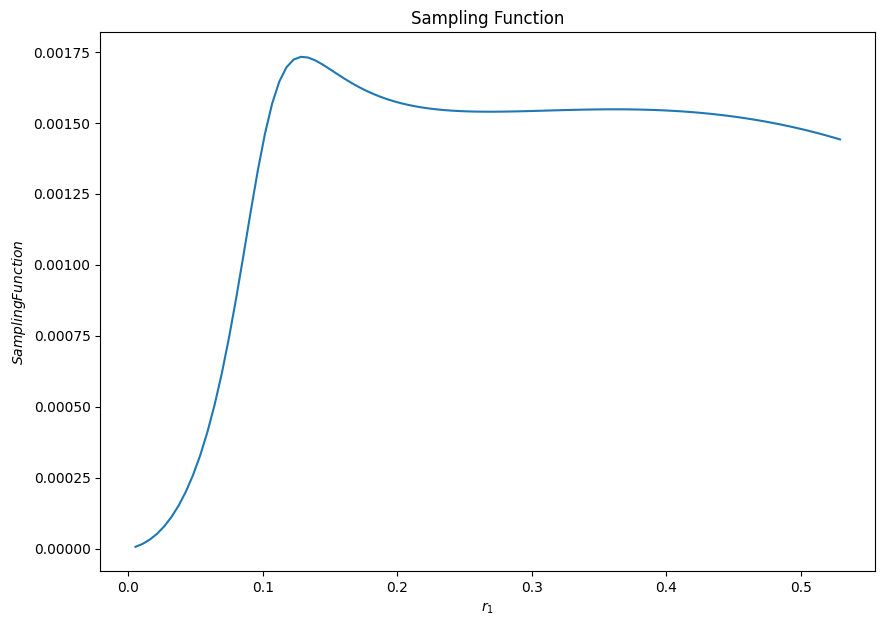

In [ ]:
Sampling_function_2d = Sampling_function_f(r1, np.pi/4, np.pi/3, 0.108, np.pi/6, np.pi/5)

fig = plt.figure(figsize=(10, 7))

# Second 3D plot
ax = fig.add_subplot()
ax.plot(r1 , Sampling_function_2d)
ax.set_xlabel('$r_1$')
ax.set_ylabel('$Sampling Function$')
ax.set_title('Sampling Function')

# pdf_2d.savefig(fig)
plt.show()

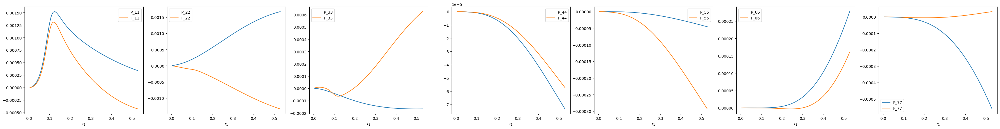

In [ ]:
fig = plt.figure(figsize=(45, 5))

# First 2D plot
ax1 = fig.add_subplot(171)
ax1.plot(r1 , P_11_2d, label = 'P_11')
ax1.plot(r1 , F_11_2d, label = 'F_11')
ax1.set_xlabel('$r_1$')
ax1.legend()

# Second 2D plot
ax2 = fig.add_subplot(172)
ax2.plot(r1 , P_22_2d, label = 'P_22')
ax2.plot(r1 , F_22_2d, label = 'F_22')
ax2.set_xlabel('$r_1$')
ax2.legend()

# Third 2D plot
ax3 = fig.add_subplot(173)
ax3.plot(r1 , P_33_2d, label = 'P_33')
ax3.plot(r1 , F_33_2d, label = 'F_33')
ax3.set_xlabel('$r_1$')
ax3.legend()

# Fourth 2D plot
ax4 = fig.add_subplot(174)
ax4.plot(r1 , P_44_2d, label = 'P_44')
ax4.plot(r1 , F_44_2d, label = 'F_44')
ax4.set_xlabel('$r_1$')
ax4.legend()

# Fifth 2D plot
ax5 = fig.add_subplot(175)
ax5.plot(r1 , P_55_2d, label = 'P_55')
ax5.plot(r1 , F_55_2d, label = 'F_55')
ax5.set_xlabel('$r_1$')
ax5.legend()

# Sixth 2D plot
ax6 = fig.add_subplot(176)
ax6.plot(r1 , P_66_2d, label = 'P_66')
ax6.plot(r1 , F_66_2d, label = 'F_66')
ax6.set_xlabel('$r_1$')
ax6.legend()

# Seventh 2D plot
ax7 = fig.add_subplot(177)
ax7.plot(r1 , P_77_2d, label = 'P_77')
ax7.plot(r1 , F_77_2d, label = 'F_77')
ax7.set_xlabel('$r_1$')
ax7.legend()

# pdf_2d.savefig(fig)
plt.show()

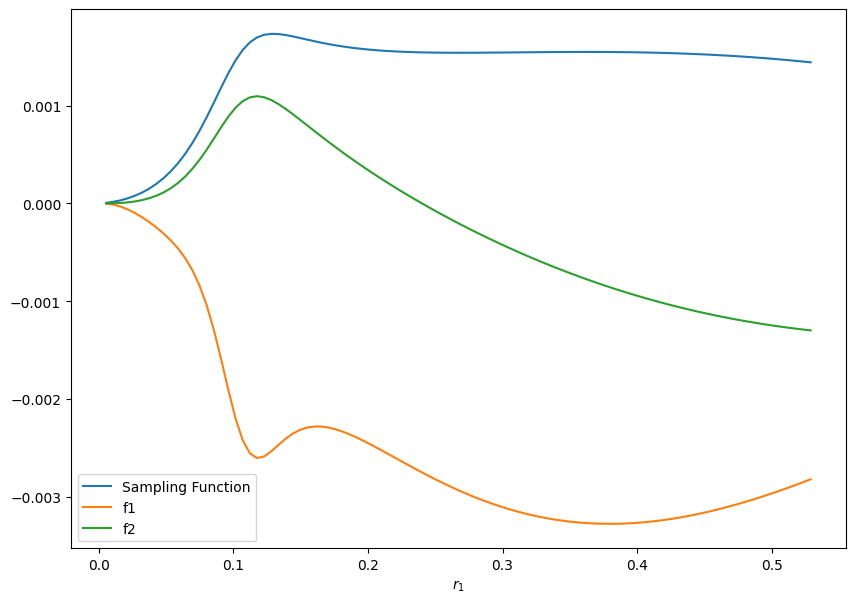

In [ ]:
fig = plt.figure(figsize=(10, 7))

# Second 3D plot
ax = fig.add_subplot()
ax.plot(r1 , Sampling_function_2d, label = 'Sampling Function')
ax.plot(r1, F1_2d, label='f1')
ax.plot(r2, F2_2d, label='f2')
ax.legend()

ax.set_xlabel('$r_1$')

# pdf_2d.savefig(fig)
plt.show()

In [ ]:
def f_over_p(f,p):
  return f/p

F11_over_P11 = f_over_p(F_11_3d, P_11_3d)
F22_over_P22 = f_over_p(F_22_3d, P_22_3d)
F33_over_P33 = f_over_p(F_33_3d, P_33_3d)
F44_over_P44 = f_over_p(F_44_3d, P_44_3d)
F55_over_P55 = f_over_p(F_55_3d, P_55_3d)
F66_over_P66 = f_over_p(F_66_3d, P_66_3d)
F77_over_P77 = f_over_p(F_77_3d, P_77_3d)

F1_over_P = f_over_p(F1_3d, Sampling_function_3d)
F2_over_P = f_over_p(F2_3d, Sampling_function_3d)

<ipython-input-95-5404fdeb7fc6>:2: RuntimeWarning: invalid value encountered in divide
  return f/p


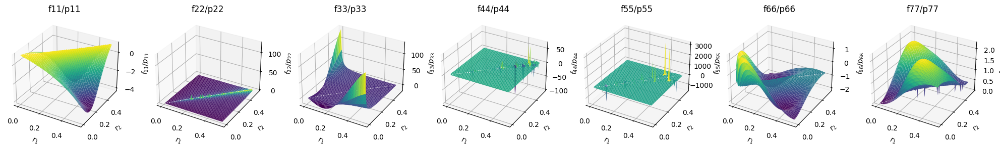

In [ ]:
fig = plt.figure(figsize=(25, 12))

# First 3D plot
ax1 = fig.add_subplot(171, projection='3d')
ax1.plot_surface(R1, R2 , F11_over_P11 , cmap='viridis')
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$r_2$')
ax1.set_zlabel('$f_{11}/p_{11}$')
ax1.set_title('f11/p11')

# Second 3D plot
ax2 = fig.add_subplot(172, projection='3d')
ax2.plot_surface(R1, R2 , F22_over_P22 , cmap='viridis')
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$r_2$')
ax2.set_zlabel('$f_{22}/p_{22}$')
ax2.set_title('f22/p22')

# Third 3D plot
ax3 = fig.add_subplot(173, projection='3d')
ax3.plot_surface(R1, R2 , F33_over_P33 , cmap='viridis')
ax3.set_xlabel('$r_1$')
ax3.set_ylabel('$r_2$')
ax3.set_zlabel('$f_{33}/p_{33}$')
ax3.set_title('f33/p33')

# Fourth 3D plot
ax4 = fig.add_subplot(174, projection='3d')
ax4.plot_surface(R1, R2 , F44_over_P44 , cmap='viridis')
ax4.set_xlabel('$r_1$')
ax4.set_ylabel('$r_2$')
ax4.set_zlabel('$f_{44}/p_{44}$')
ax4.set_title('f44/p44')

# Fifth 3D plot
ax5 = fig.add_subplot(175, projection='3d')
ax5.plot_surface(R1, R2 , F55_over_P55 , cmap='viridis')
ax5.set_xlabel('$r_1$')
ax5.set_ylabel('$r_2$')
ax5.set_zlabel('$f_{55}/p_{55}$')
ax5.set_title('f55/p55')

# Sixth 3D plot
ax6 = fig.add_subplot(176, projection='3d')
ax6.plot_surface(R1, R2 , F66_over_P66 , cmap='viridis')
ax6.set_xlabel('$r_1$')
ax6.set_ylabel('$r_2$')
ax6.set_zlabel('$f_{66}/p_{66}$')
ax6.set_title('f66/p66')

# Seventh 3D plot
ax7 = fig.add_subplot(177, projection='3d')
ax7.plot_surface(R1, R2 , F77_over_P77 , cmap='viridis')
ax7.set_xlabel('$r_1$')
ax7.set_ylabel('$r_2$')
ax7.set_zlabel('$f_{77}/p_{77}$')
ax7.set_title('f77/p77')

# pdf_3d.savefig(fig)

plt.show()

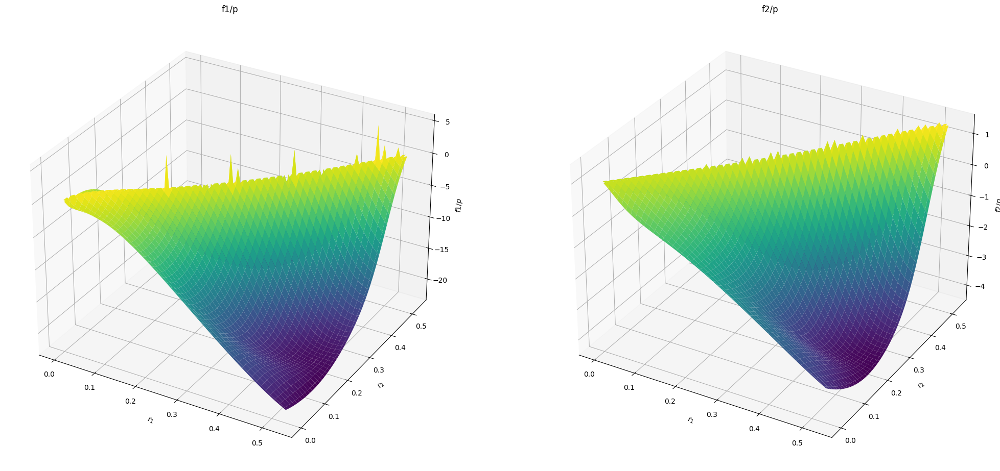

In [ ]:
fig = plt.figure(figsize=(25, 12))

# First 3D plot
ax1 = fig.add_subplot(121, projection='3d')
ax1.plot_surface(R1, R2 , F1_over_P , cmap='viridis')
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$r_2$')
ax1.set_zlabel('$f1/p$')
ax1.set_title('f1/p')

# Second 3D plot
ax2 = fig.add_subplot(122, projection='3d')
ax2.plot_surface(R1, R2 , F2_over_P , cmap='viridis')
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$r_2$')
ax2.set_zlabel('$f2/p$')
ax2.set_title('f2/p')

# pdf_3d.savefig(fig)
plt.show()

# pdf_3d.close()

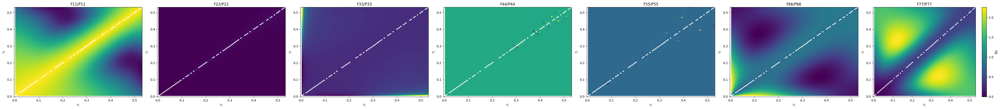

In [ ]:
fig, axes = plt.subplots(1, 7, figsize=(45, 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [F11_over_P11, F22_over_P22, F33_over_P33, F44_over_P44, F55_over_P55, F66_over_P66, F77_over_P77]
titles = ['F11/P11', 'F22/P22', 'F33/P33', 'F44/P44', 'F55/P55', 'F66/P66', 'F77/P77']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    ax.set_title(titles[i])
    ax.set_xlabel('$r_1$')
    ax.set_ylabel('$r_2$')
    # Use pcolormesh to plot the data
    im = ax.pcolormesh(R1, R2, functions[i], cmap= 'viridis', shading = 'auto')

# Add a colorbar for the first surface
plt.colorbar(im, label='f/p')

# Adjust layout
plt.tight_layout()

# pdf_cplot.savefig(fig)

# Show the plots
plt.show()

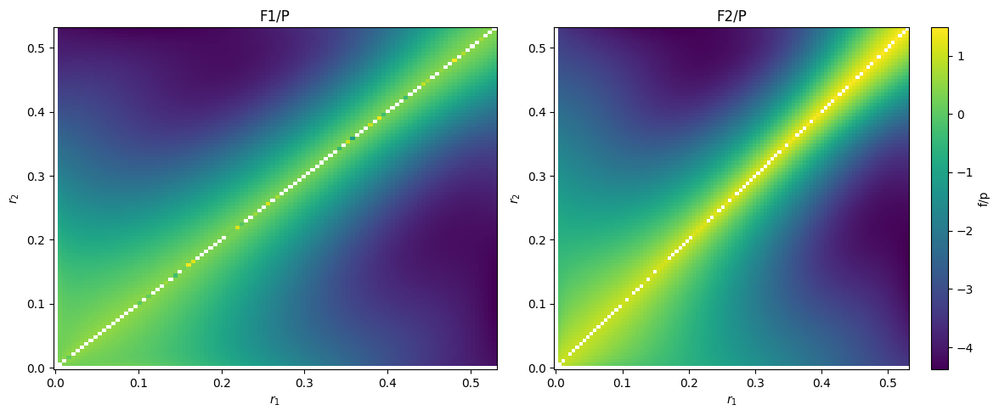

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# Flatten the axes array for easy iteration
axes = axes.flatten()

# List of y data to plot
functions = [F1_over_P, F2_over_P]
titles = ['F1/P', 'F2/P']

# Plot each y data on a subplot
for i, ax in enumerate(axes):
    ax.set_title(titles[i])
    ax.set_xlabel('$r_1$')
    ax.set_ylabel('$r_2$')
    # Use pcolormesh to plot the data
    im = ax.pcolormesh(R1, R2, functions[i], cmap= 'viridis', shading = 'auto')

# Add a colorbar for the first surface
plt.colorbar(im, label='f/p')

# Adjust layout
plt.tight_layout()

# pdf_cplot.savefig(fig)

# Show the plots
plt.show()

# pdf_cplot.close()

In [ ]:
f11_over_p11 = f_over_p(F_11_2d , P_11_2d)
f22_over_p22 = f_over_p(F_22_2d , P_22_2d)
f33_over_p33 = f_over_p(F_33_2d , P_33_2d)
f44_over_p44 = f_over_p(F_44_2d , P_44_2d)
f55_over_p55 = f_over_p(F_55_2d , P_55_2d)
f66_over_p66 = f_over_p(F_66_2d , P_66_2d)
f77_over_p77 = f_over_p(F_77_2d , P_77_2d)

f1_over_p = f_over_p(F1_2d , Sampling_function_2d)
f2_over_p = f_over_p(F2_2d , Sampling_function_2d)

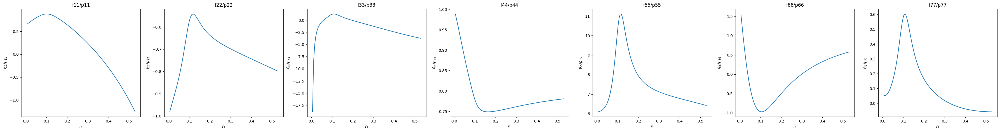

In [ ]:
fig = plt.figure(figsize=(45, 5))

# First 3D plot
ax1 = fig.add_subplot(171)
ax1.plot(r1 , f11_over_p11)
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$f_{11}/p_{11}$')
ax1.set_title('f11/p11')

# Second 3D plot
ax2 = fig.add_subplot(172)
ax2.plot(r1 , f22_over_p22)
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$f_{22}/p_{22}$')
ax2.set_title('f22/p22')

# Third 3D plot
ax3 = fig.add_subplot(173)
ax3.plot(r1 , f33_over_p33)
ax3.set_xlabel('$r_1$')
ax3.set_ylabel('$f_{33}/p_{33}$')
ax3.set_title('f33/p33')

# Fourth 3D plot
ax4 = fig.add_subplot(174)
ax4.plot(r1 , f44_over_p44)
ax4.set_xlabel('$r_1$')
ax4.set_ylabel('$f_{44}/p_{44}$')
ax4.set_title('f44/p44')

# Fifth 3D plot
ax5 = fig.add_subplot(175)
ax5.plot(r1, f55_over_p55)
ax5.set_xlabel('$r_1$')
ax5.set_ylabel('$f_{55}/p_{55}$')
ax5.set_title('f55/p55')

# Sixth 3D plot
ax6 = fig.add_subplot(176)
ax6.plot(r1 , f66_over_p66)
ax6.set_xlabel('$r_1$')
ax6.set_ylabel('$f_{66}/p_{66}$')
ax6.set_title('f66/p66')

# Seventh 3D plot
ax7 = fig.add_subplot(177)
ax7.plot(r1 , f77_over_p77)
ax7.set_xlabel('$r_1$')
ax7.set_ylabel('$f_{77}/p_{77}$')
ax7.set_title('f77/p77')

# pdf_2d.savefig(fig)
plt.show()

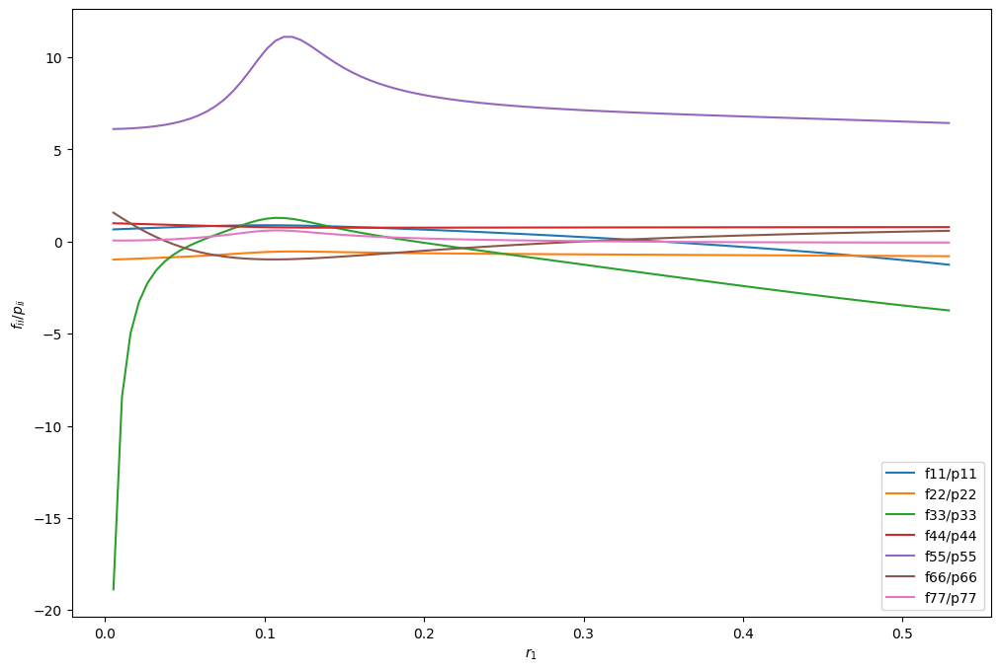

In [ ]:
fig = plt.figure(figsize=(12, 8))

# First 3D plot
ax = fig.add_subplot()
ax.plot(r1 , f11_over_p11, label = 'f11/p11')
ax.plot(r1 , f22_over_p22, label = 'f22/p22')
ax.plot(r1 , f33_over_p33, label = 'f33/p33')
ax.plot(r1 , f44_over_p44, label = 'f44/p44')
ax.plot(r1 , f55_over_p55, label = 'f55/p55')
ax.plot(r1 , f66_over_p66, label = 'f66/p66')
ax.plot(r1 , f77_over_p77, label = 'f77/p77')

ax.set_xlabel('$r_1$')
ax.set_ylabel('$f_{ii}/p_{ii}$')

ax.legend()
# pdf_2d.savefig(fig)

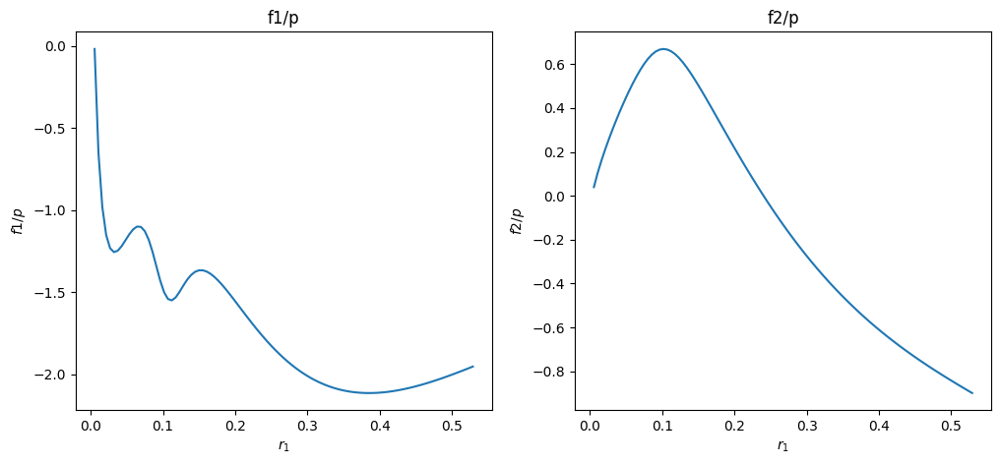

In [ ]:
fig = plt.figure(figsize=(12, 5))

# First 3D plot
ax1 = fig.add_subplot(121)
ax1.plot(r1 , f1_over_p)
ax1.set_xlabel('$r_1$')
ax1.set_ylabel('$f1/p$')
ax1.set_title('f1/p')

# Second 3D plot
ax2 = fig.add_subplot(122)
ax2.plot(r1 , f2_over_p)
ax2.set_xlabel('$r_1$')
ax2.set_ylabel('$f2/p$')
ax2.set_title('f2/p')

# pdf_2d.savefig(fig)
plt.show()

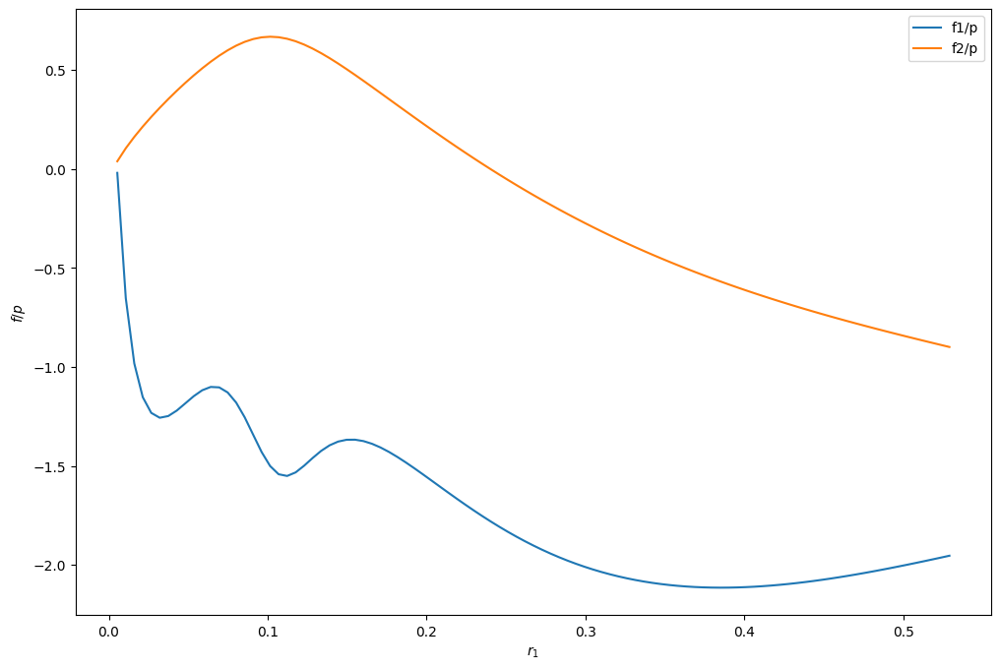

In [ ]:
fig = plt.figure(figsize=(12, 8))

ax = fig.add_subplot()
ax.plot(r1 , f1_over_p, label = 'f1/p')
ax.plot(r1 , f2_over_p, label = 'f2/p')

ax.set_xlabel('$r_1$')
ax.set_ylabel('$f/p$')

ax.legend()
# pdf_2d.savefig(fig)

# pdf_2d.close()

In [ ]:
F11_over_P11 = F11_over_P11.reshape(10000)
F22_over_P22 = F22_over_P22.reshape(10000)
F33_over_P33 = F33_over_P33.reshape(10000)
F44_over_P44 = F44_over_P44.reshape(10000)
F55_over_P55 = F55_over_P55.reshape(10000)
F66_over_P66 = F66_over_P66.reshape(10000)
F77_over_P77 = F77_over_P77.reshape(10000)

F1_over_P = F1_over_P.reshape(10000)
F2_over_P = F2_over_P.reshape(10000)

In [ ]:
# Removing nan and inf values from the arrays
mask_f11_p11 = ~np.isnan(F11_over_P11) & ~np.isinf(F11_over_P11)
# Filter the array
F11_over_P11 = F11_over_P11[mask_f11_p11]

mask_f22_p22 = ~np.isnan(F22_over_P22) & ~np.isinf(F22_over_P22)
F22_over_P22 = F22_over_P22[mask_f22_p22]

mask_f33_p33 = ~np.isnan(F33_over_P33) & ~np.isinf(F33_over_P33)
F33_over_P33 = F33_over_P33[mask_f33_p33]

mask_f44_p44 = ~np.isnan(F44_over_P44) & ~np.isinf(F44_over_P44)
F44_over_P44 = F44_over_P44[mask_f44_p44]

mask_f55_p55 = ~np.isnan(F55_over_P55) & ~np.isinf(F55_over_P55)
F55_over_P55 = F55_over_P55[mask_f55_p55]

mask_f66_p66 = ~np.isnan(F66_over_P66) & ~np.isinf(F66_over_P66)
F66_over_P66 = F66_over_P66[mask_f66_p66]

mask_f77_p77 = ~np.isnan(F77_over_P77) & ~np.isinf(F77_over_P77)
F77_over_P77 = F77_over_P77[mask_f77_p77]

mask_f1_p = ~np.isnan(F1_over_P) & ~np.isinf(F1_over_P)
F1_over_P = F1_over_P[mask_f1_p]

mask_f2_p = ~np.isnan(F2_over_P) & ~np.isinf(F2_over_P)
F2_over_P = F2_over_P[mask_f2_p]

In [ ]:
Var_F11_P11 = np.var(F11_over_P11)
Var_F22_P22 = np.var(F22_over_P22)
Var_F33_P33 = np.var(F33_over_P33)
Var_F44_P44 = np.var(F44_over_P44)
Var_F55_P55 = np.var(F55_over_P55)
Var_F66_P66 = np.var(F66_over_P66)
Var_F77_P77 = np.var(F77_over_P77)

Var_F1_P = np.var(F1_over_P)
Var_F2_P = np.var(F2_over_P)

In [ ]:
print('Variance of F11/P11 is ' , Var_F11_P11)
print('Variance of F22/P22 is ' , Var_F22_P22)
print('Variance of F33/P33 is ' , Var_F33_P33)
print('Variance of F44/P44 is ' , Var_F44_P44)
print('Variance of F55/P55 is ' , Var_F55_P55)
print('Variance of F66/P66 is ' , Var_F66_P66)
print('Variance of F77/P77 is ' , Var_F77_P77)
print('')
print('Variance of F1/P is ' , Var_F1_P)
print('Variance of F2/P is ' , Var_F2_P)

Variance of F11/P11 is  2.2996008258713574
Variance of F22/P22 is  2.2490867729179134
Variance of F33/P33 is  101.83299470113546
Variance of F44/P44 is  6.955267742257988
Variance of F55/P55 is  4161.660379150563
Variance of F66/P66 is  0.36135677927290244
Variance of F77/P77 is  0.36343979075459504

Variance of F1/P is  51.97291727392096
Variance of F2/P is  2.667298197903615
